<a id="A"></a>
# <div style="text-align:center; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> House Prices - Advanced Regression </b></div>

![apartments](https://images.pexels.com/photos/681331/pexels-photo-681331.jpeg)

<a id="A"></a>
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Import Dependencies </b></div>

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import math
import pandas as pd
import numpy as np
import missingno as msn
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
from pypalettes import get_hex
from scipy import stats
from scipy.stats import chi2_contingency
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import PoissonRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from xgboost import XGBRegressor
from IPython.display import display_html
from itertools import chain,cycle
pd.pandas.set_option('display.max_rows',None)
pd.pandas.set_option('display.max_columns',None)
fig_size = [12, 6]

<a id="A"></a>
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Assemble Dataset </b></div>

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Prepare dataset and establish common variables </span>

In [2]:
df_train = pd.read_csv('../dataset/train.csv')
df_test = pd.read_csv('../dataset/test.csv')


In [19]:
df_train_num = df_train.select_dtypes(include=[np.number]).drop(columns='SalePrice')
df_train_cat = df_train.select_dtypes(exclude=[np.number])
df_train_target = df_train['SalePrice']

df_test_num = df_test.select_dtypes(include=[np.number])
df_test_cat = df_test.select_dtypes(exclude=[np.number])


In [3]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [21]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


<a id="A"></a> 
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b>  DataFrame Analysis </b></div>

<span style="font-family:Cambria; color:#0261ab; font-size: 28px; text-shadow: 0.5px 0.5px black"> Training Set </span>

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Shape </span>

In [22]:
df_train.shape

(1460, 81)

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Unique data types </span>

In [23]:
df_train.dtypes.unique().tolist()

[dtype('int64'), dtype('O'), dtype('float64')]

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Dataset information  </span>

In [24]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Numerical description </span>

In [25]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Categorical description </span>

In [26]:
df_train.select_dtypes(['object']).describe()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,588,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,3,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,445,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


<span style="font-family:Cambria; color:#0261ab; font-size: 29px; text-shadow: 0.5px 0.5px black"> Test Set </span>

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Shape </span>

In [27]:
df_test.shape

(1459, 80)

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Unique data types </span>

In [28]:
df_test.dtypes.unique().tolist()

[dtype('int64'), dtype('O'), dtype('float64')]

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Dataset information </span>

In [29]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Numerical description </span>

In [30]:
df_test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1444.000000,1458.000000,1458.000000,1458.000000,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1457.000000,1457.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.00000,1381.000000,1458.000000,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1983.662783,100.709141,439.203704,52.619342,554.294925,1046.117970,1156.534613,325.967786,3.543523,1486.045922,0.434454,0.065202,1.570939,0.377656,2.854010,1.042495,6.385195,0.58122,1977.721217,1.766118,472.768861,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,58.167923,6.104181,2007.769705
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,21.130467,177.625900,455.268042,176.753926,437.260486,442.898624,398.165820,420.610226,44.043251,485.566099,0.530648,0.252468,0.555190,0.503017,0.829788,0.208472,1.508895,0.64742,26.431175,0.775945,217.048611,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,630.806978,2.722432,1.301740
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,407.000000,0.000000,0.000000,407.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.00000,1895.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,1963.000000,0.000000,0.000000,0.000000,219.250000,784.000000,873.500000,0.000000,0.000000,1117.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.00000,1959.000000,1.000000,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1992.000000,0.000000,350.500000,0.000000,460.000000,988.000000,1079.000000,0.000000,0.000000,1432.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,0.00000,1979.000000,2.000000,480.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,2004.000000,164.000000,753.500000,0.000000,797.750000,1305.000000,1382.500000,676.000000,0.000000,1721.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.00000,2002.000000,2.000000,576.000000,168.000000,72.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,2010.000000,1290.000000,4010.000000,1526.000000,2140.000000,5095.000000,5095.000000,1862.000000,1064.000000,5095.000000,3.000000,2.000000,4.000000,2.000000,6.000000,2.000000,15.000000,4.00000,2207.000000,5.000000,1488.000000,1424.000000,742.000000,1012.000000,360.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Categorical description </span>

In [31]:
df_test.select_dtypes(['object']).describe()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1455,1459,107,1459,1459,1457,1459,1459,1459,1459,1459,1459,1459,1459,1459,1458,1458,565,1459,1459,1459,1415,1414,1415,1417,1417,1459,1459,1459,1459,1458,1457,729,1383,1381,1381,1381,1459,3,290,51,1458,1459
unique,5,2,2,4,4,1,5,3,25,9,5,5,7,6,4,13,15,3,4,5,6,4,4,4,6,6,4,5,2,4,4,7,5,6,3,4,5,3,2,4,3,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Ex,MnPrv,Shed,WD,Normal
freq,1114,1453,70,934,1311,1457,1081,1396,218,1251,1444,1205,745,1169,1442,510,510,434,892,1256,661,634,1295,951,431,1237,1446,752,1358,1337,757,1357,364,853,625,1293,1328,1301,2,172,46,1258,1204


<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Distribution Analysis </b></div> 

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Scatterplot: 'Id'-based target distribution </span>

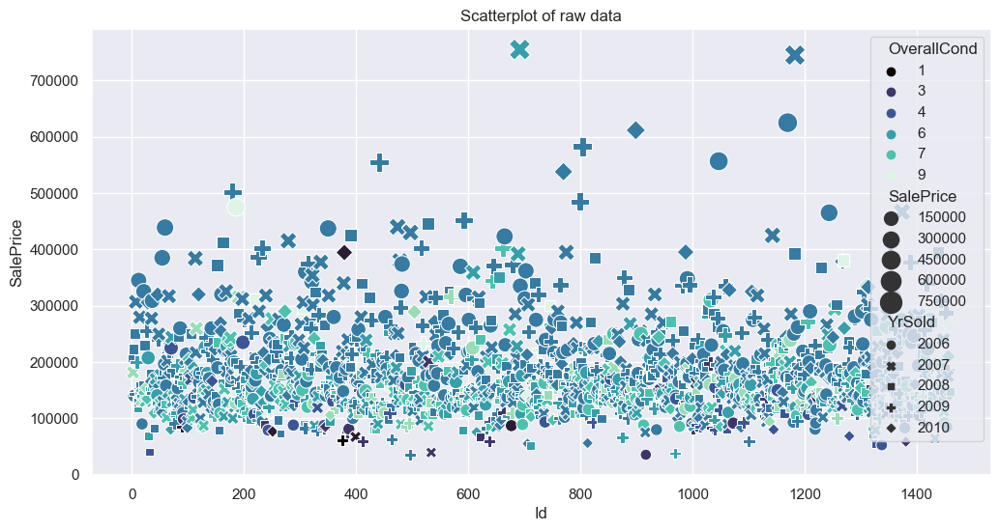

In [32]:
sns.set(rc={'figure.figsize':fig_size})
sns.scatterplot(x=df_train.Id, y=df_train.SalePrice, size=df_train.SalePrice, hue=df_train.OverallCond, style=df_train.YrSold, sizes=(70,250), palette="mako")
plt.title('Scatterplot of raw data', fontsize=12)
plt.show()

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • General target distribution </span>

Skewness for Training Set: 1.8828757597682129
Kurtosis for Training Set: 6.536281860064529


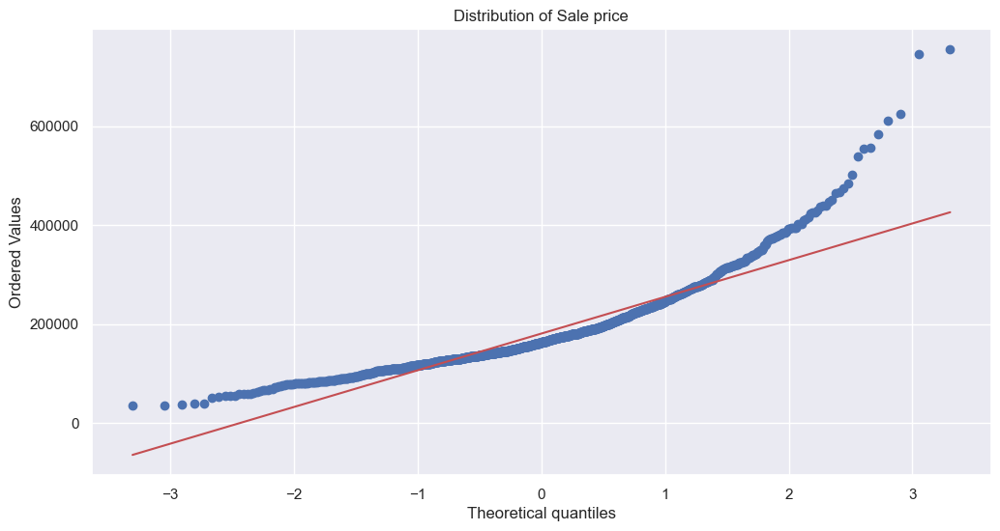

In [33]:
print(f'Skewness for Training Set: {df_train_target.skew()}')
print(f'Kurtosis for Training Set: {df_train_target.kurt()}')

def probplot_target(target):
    sns.set(rc={'figure.figsize':fig_size})
    pplot = stats.probplot(df_train_target, dist='norm', plot=plt)
    plt.title('Distribution of Sale price')
    plt.show()

probplot_target(df_train_target)


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Histograms </span>

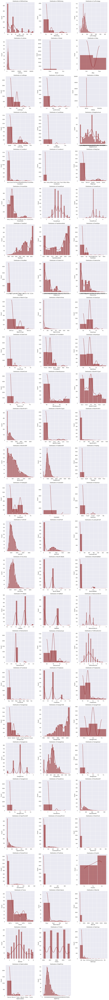

In [34]:
def plot_histograms(df):
    num_features = len(df.columns)
    num_cols = 3 
    num_rows = math.ceil(num_features / num_cols)  
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))  
    axes = axes.flatten() 
    
    for i, col in enumerate(df.columns):
        sns.histplot(df[col], color='maroon', kde=True, ax=axes[i])  
        axes[i].set_title(f'Distribution of {col}')
        axes[i].grid(True) 
        
    for j in range(i + 1, num_rows * num_cols):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()
 
df_histogram = df_train.drop(columns=['Id'], axis=1)
plot_histograms(df_histogram)  


<span style="font-family:Cambria; color:#0261ab; font-size: 17px; text-shadow: 0.5px 0.5px black"> Observation: Most feature distributions are highly skewed. </span>

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Numeric boxplots </span>

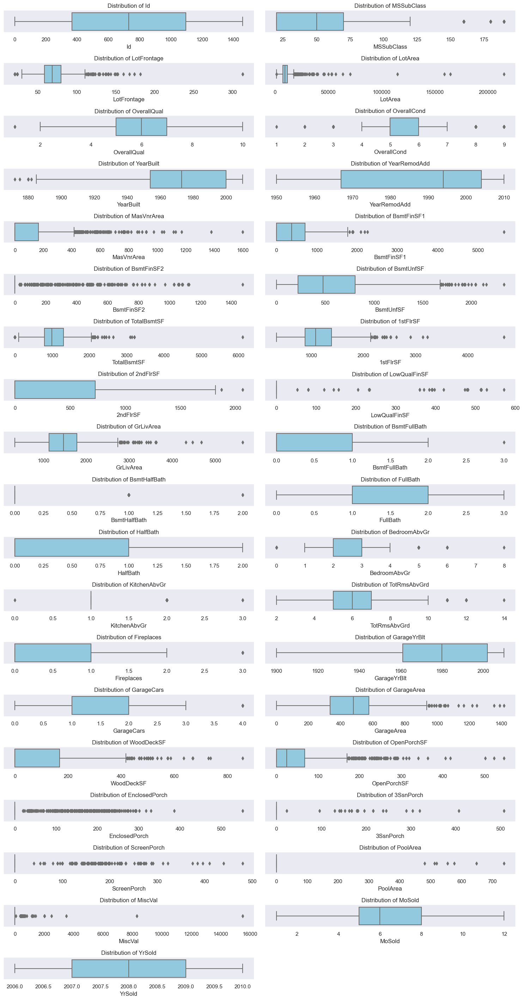

In [35]:
def plot_boxplot_num(df):
    num_features = len(df.columns)
    num_cols = 2 
    num_rows = math.ceil(num_features / num_cols)  
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 1.5))  
    axes = axes.flatten() 
    
    for i, col in enumerate(df.columns):
        sns.boxplot(data=df, x=col, color='skyblue', ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].grid(False) 
        
    for j in range(i + 1, num_rows * num_cols):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()

plot_boxplot_num(df_train_num)  


 <span style="font-family:Cambria; color:#0261ab; font-size: 17px; text-shadow: 0.5px 0.5px black"> 
    Observation: Too many outliers.
</span>

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Categorical boxplots </span>

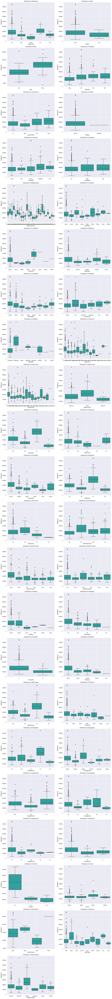

In [36]:
def plot_boxplot_cat(df, target):
    sns.set_theme(style="darkgrid")
    palette = get_hex("Acadia", keep_first_n=3)
    num_features = len(df.columns)
    num_cols = 2 
    num_rows = math.ceil(num_features / num_cols)  
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 6))  
    axes = axes.flatten() 
    
    for i, col in enumerate(df.columns):
        sns.boxplot(data=df, x=col, y=target, color='lightseagreen', ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].grid(True) 
        
    for j in range(i + 1, num_rows * num_cols):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()

plot_boxplot_cat(df_train_cat, df_train_target)  


 <span style="font-family:Cambria; color:#0261ab; font-size: 17px; text-shadow: 0.5px 0.5px black"> 
    Observation: Requires categorical feature selection
</span>

<a id="A"></a>
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Duplicate Values </b></div>


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Check for duplications </span>

In [37]:
df_train.duplicated().sum()

0

In [38]:
duplicate_mask = df_train.duplicated()
duplicates = df_train[duplicate_mask]
duplicates.shape


(0, 81)

In [39]:
df_train = df_train.drop_duplicates()
df_train.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [40]:
df_train.shape

(1460, 81)

<a id="A"></a>
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Missing Values </b></div>


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Heatmap of missing values </span>

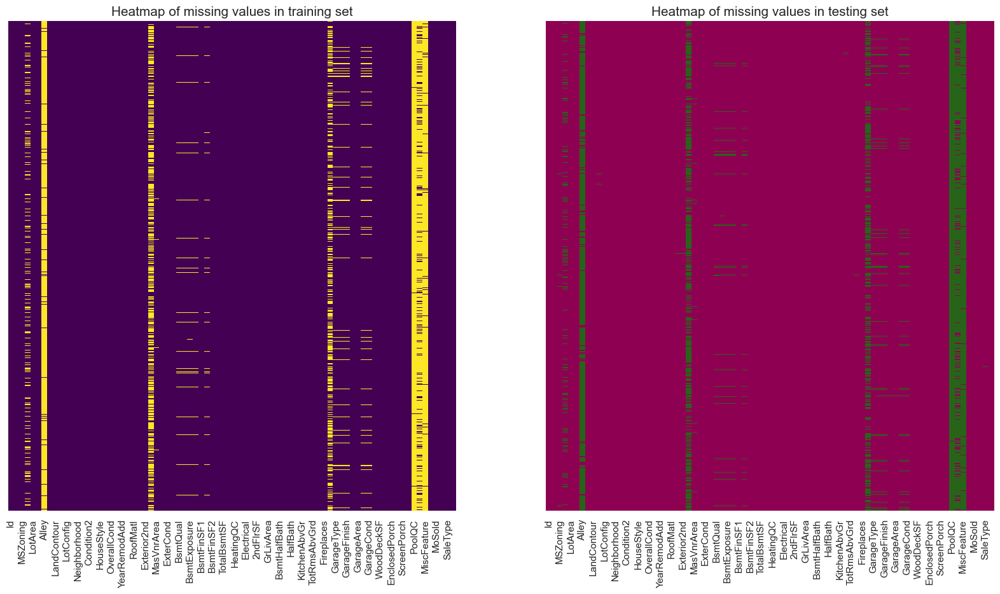

In [41]:
fig, axes = plt.subplots(1, 2, sharex=True, figsize=(20,10))
sns.heatmap(ax=axes[0], yticklabels=False, data=df_train.isnull(), cbar=False, cmap="viridis")
sns.heatmap(ax=axes[1], yticklabels=False, data=df_test.isnull(), cbar=False, cmap="PiYG")
axes[0].set_title('Heatmap of missing values in training set', fontsize=15)
axes[1].set_title('Heatmap of missing values in testing set', fontsize=15)
plt.show()


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Missingno matrix </span>

<Axes: >

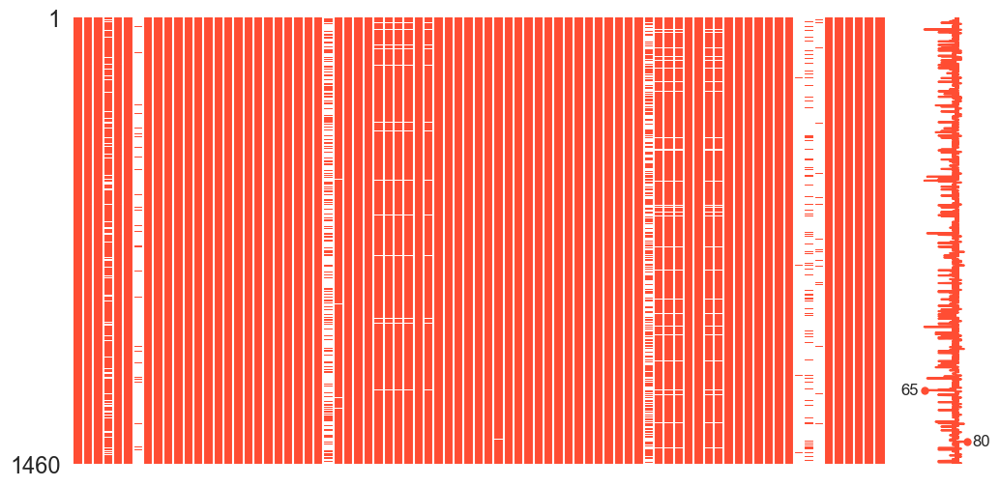

In [42]:
msn.matrix(df_train, color=(1, 0.30, 0.20), figsize=fig_size, fontsize=14)

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Missingno Heatmap </span>

Text(0.5, 1.0, 'Missingno Heatmap')

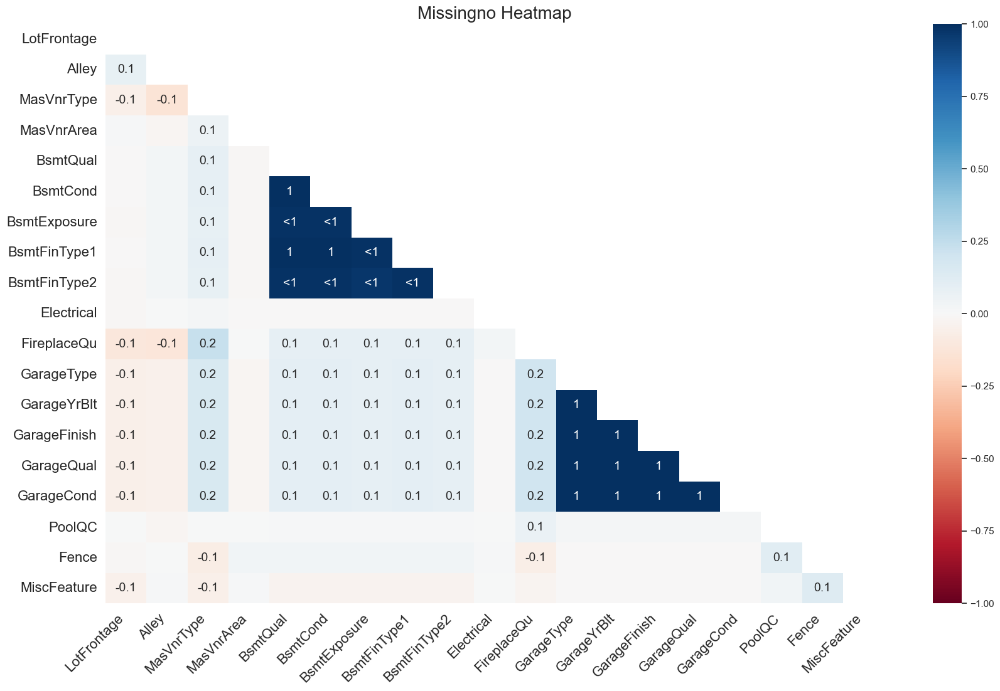

In [43]:
msn.heatmap(df_train)
plt.title("Missingno Heatmap", fontsize=20)

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Percent distribution of features with null values </span>

In [44]:
print(f"Total Null Values in Training data before handling Missing values: {df_train.isnull().sum().sum()}")
print(f"Total Null Values in Test data before handling Missing values: {df_test.isnull().sum().sum()}")

Total Null Values in Training data before handling Missing values: 7829
Total Null Values in Test data before handling Missing values: 7878


In [45]:
def get_null_features(df):
    null_features=[(feature,np.round(df[feature].isnull().mean(),2)*100) 
                   for feature in df.columns if df[feature].isnull().sum(0)]
    null_df = pd.DataFrame(null_features, columns=['Features','Null %'])
    return null_df.sort_values(by='Null %', ascending=False)

def display_side_by_side(*args,titles=cycle([''])):
    html_str=''
    for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
        html_str+='<th style="text-align:center"><td style="vertical-align:top">'
        html_str+=f'<h2 style="text-align: center;">{title}</h2>'
        html_str+=df.to_html().replace('table','table style="display:inline"')
        html_str+='</td></th>'
    display_html(html_str,raw=True)

null_features_train = get_null_features(df_train)
null_features_test = get_null_features(df_test)

display_side_by_side(null_features_train, null_features_test, titles=['Training set','Test set'])

,Features,Null %
16,PoolQC,100.0
18,MiscFeature,96.0
1,Alley,94.0
17,Fence,81.0
2,MasVnrType,60.0
10,FireplaceQu,47.0
0,LotFrontage,18.0
11,GarageType,6.0
12,GarageYrBlt,6.0
13,GarageFinish,6.0


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Bar plot illustrating the distribution </span>

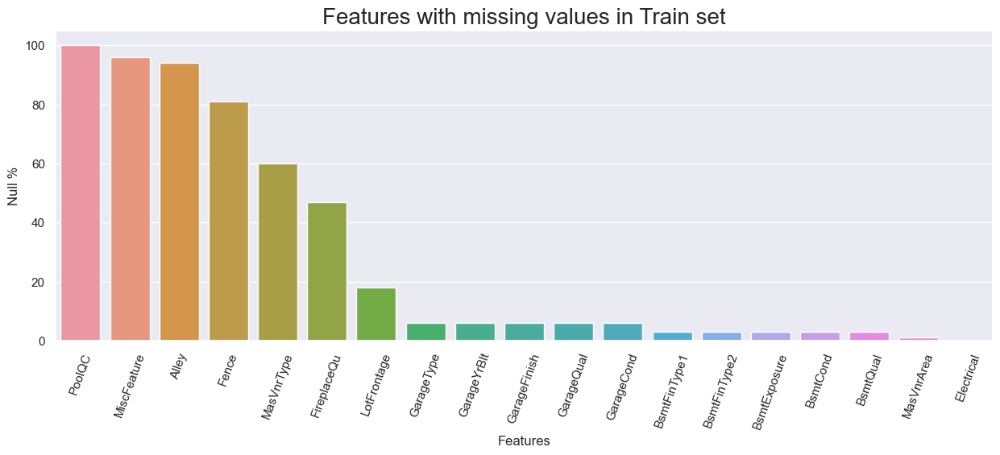

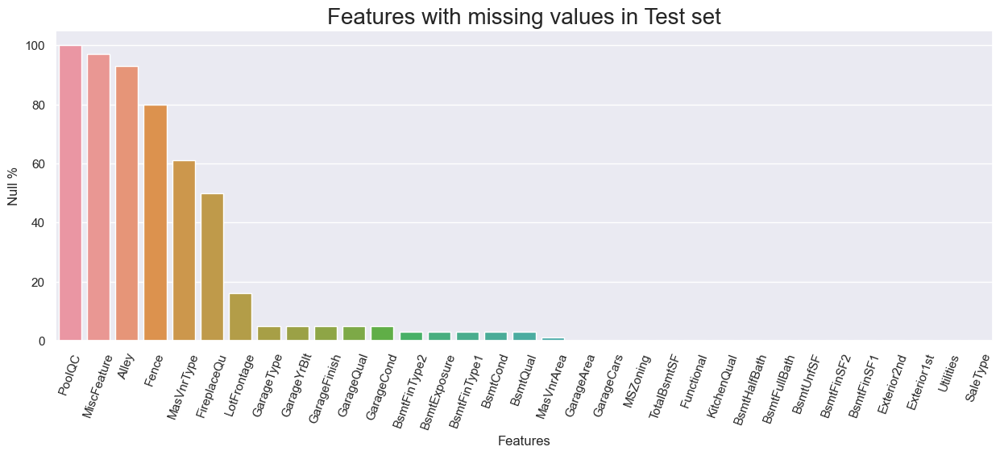

In [46]:
def missing_values_bar(x, y, set_name):
    fig, ax = plt.subplots(figsize=(15, 5))
    sns.barplot(x=x, y=y)
    plt.xticks(rotation=70)
    plt.title(f"Features with missing values in {set_name} set", fontsize=20)
    plt.show()
    
missing_values_bar(null_features_train['Features'], null_features_train['Null %'], 'Train')
missing_values_bar(null_features_test['Features'], null_features_test['Null %'], 'Test')

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Truncating columns with missing value > 50% </span>

In [47]:
def drop_columns(threshold):
    return [column for column in df_train.columns if df_train[column].isnull().mean()>threshold] 

threshold=0.5
drop_col=drop_columns(threshold)
df_train=df_train.drop(columns=drop_col, axis=1) 
df_test=df_test.drop(columns=drop_col, axis=1)

print(f">Remaining columns for Training set: \n{df_train.columns}, {df_train.shape}\n")
print(f">Remaining columns for Test set: \n{df_test.columns}, {df_test.shape}")

>Remaining columns for Training set: 
Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'Pa

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Replacing the remaining missing values with median for numerical data </span>

In [48]:
df_train.fillna(df_train_num.median(), inplace=True)
df_test.fillna(df_test_num.median(), inplace=True)

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Replacing the remaining missing values with median for categorical data </span>

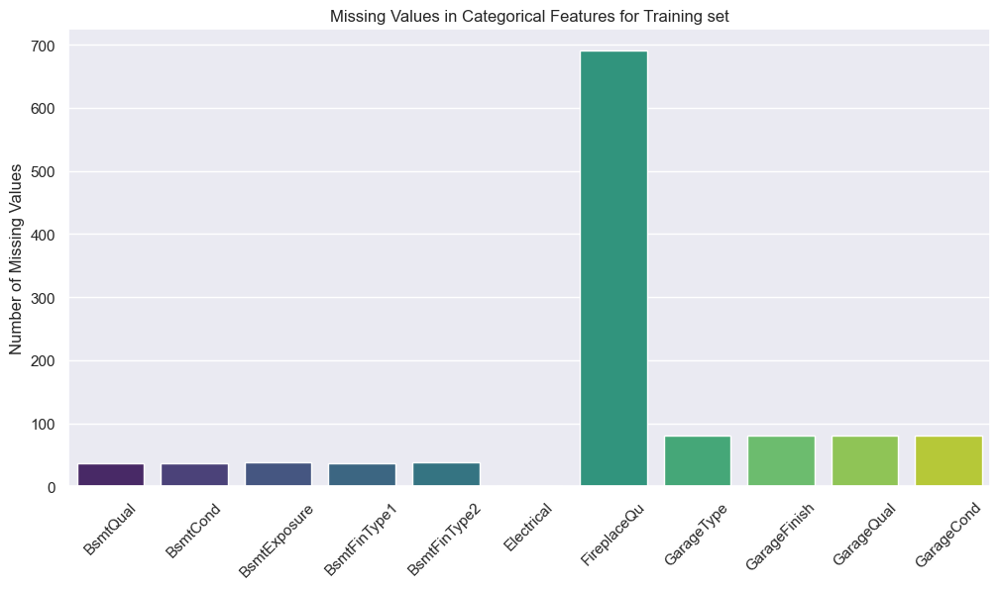

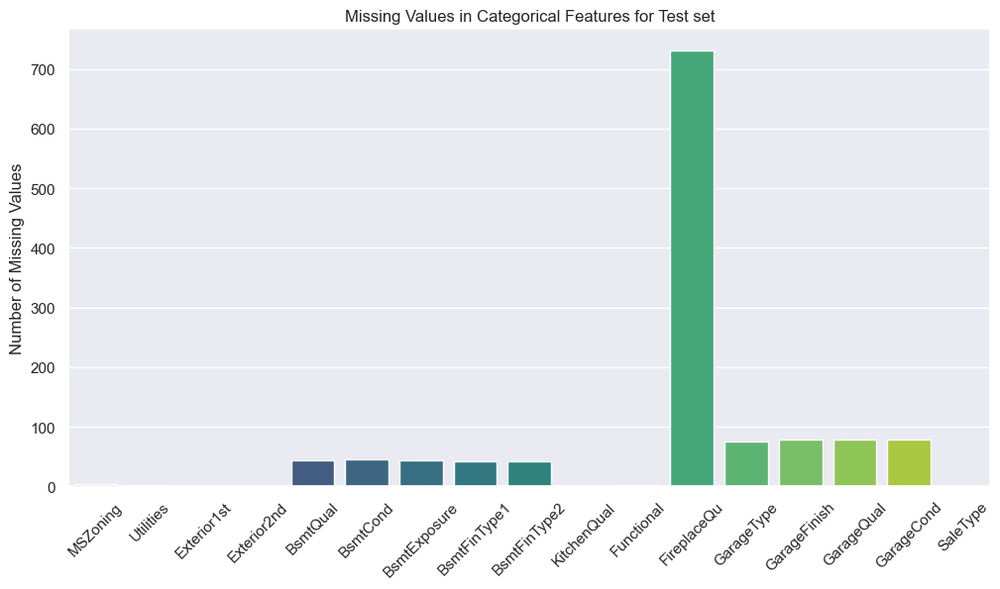

In [49]:
def cat_missing_values(df, set_name):
    categorical_cols = df.select_dtypes(include=['object']).columns

    missing_values = df[categorical_cols].isnull().sum()
    missing_values = missing_values[missing_values > 0]

    plt.figure(figsize=fig_size)
    sns.barplot(x=missing_values.index, y=missing_values.values, palette='viridis')
    plt.xticks(rotation=45)
    plt.title(f'Missing Values in Categorical Features for {set_name} set')
    plt.ylabel('Number of Missing Values')
    plt.show()
    
cat_missing_values(df_train, 'Training')
cat_missing_values(df_test, 'Test')

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Feature type conversion </span>

In [50]:
convert_features = ['BsmtHalfBath', 'KitchenAbvGr', 'PoolArea', 'Fireplaces', 'FullBath', 'HalfBath', 'GarageCars', 
                    'GarageYrBlt', 'OverallQual', 'MSSubClass', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd']

astype_features = ['OverallCond', 'YrSold', 'MoSold']

for feature in convert_features:
    df_train[feature] = df_train[feature].apply(str)
    df_test[feature] = df_test[feature].apply(str)
    
for feature in astype_features:
    df_train[feature] = df_train[feature].astype(str)
    df_test[feature] = df_test[feature].astype(str)
    
                                                     

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Handle categorical missing values manually </span>

In [51]:
# Kitchen Features ---
df_train['KitchenQual'] = df_train['KitchenQual'].fillna(df_train['KitchenQual'].mode()[0])
df_train['KitchenAbvGr'] = df_train['KitchenAbvGr'].fillna(1)

df_test['KitchenQual'] = df_test['KitchenQual'].fillna(df_test['KitchenQual'].mode()[0])
df_test['KitchenAbvGr'] = df_test['KitchenAbvGr'].fillna(1)

# Basement Features ---
df_train['BsmtHalfBath'] = df_train['BsmtHalfBath'].fillna(0)
df_train['BsmtQual'] = df_train['BsmtQual'].fillna('None')
df_train['BsmtCond'] = df_train['BsmtCond'].fillna('None')
df_train['BsmtExposure'] = df_train['BsmtExposure'].fillna('No')
df_train['BsmtFinType1'] = df_train['BsmtFinType1'].fillna('None')
df_train['BsmtFinType2'] = df_train['BsmtFinType2'].fillna('None')

df_test['BsmtHalfBath'] = df_test['BsmtHalfBath'].fillna(0)
df_test['BsmtQual'] = df_test['BsmtQual'].fillna('None')
df_test['BsmtCond'] = df_test['BsmtCond'].fillna('None')
df_test['BsmtExposure'] = df_test['BsmtExposure'].fillna('No')
df_test['BsmtFinType1'] = df_test['BsmtFinType1'].fillna('None')
df_test['BsmtFinType2'] = df_test['BsmtFinType2'].fillna('None')

# Garage Features ---
df_train['GarageYrBlt'] = df_train['GarageYrBlt'].fillna(0)
df_train['GarageFinish'] = df_train['GarageFinish'].fillna('No')
df_train['GarageQual'] = df_train['GarageQual'].fillna('No')
df_train['GarageCond'] = df_train['GarageCond'].fillna('No')
df_train['GarageType'] = df_train['GarageType'].fillna('No')

df_test['GarageYrBlt'] = df_test['GarageYrBlt'].fillna(0)
df_test['GarageFinish'] = df_test['GarageFinish'].fillna('No')
df_test['GarageQual'] = df_test['GarageQual'].fillna('No')
df_test['GarageCond'] = df_test['GarageCond'].fillna('No')
df_test['GarageType'] = df_test['GarageType'].fillna('No')

# Luxury Features ---
df_train['PoolArea'] = df_train['PoolArea'].fillna(0)
df_train['FireplaceQu'] = df_train['FireplaceQu'].fillna('No')
df_train['Exterior1st'] = df_train['Exterior1st'].fillna(df_train['Exterior1st'].mode()[0]) 
df_train['Exterior2nd'] = df_train['Exterior2nd'].fillna(df_train['Exterior2nd'].mode()[0])

df_test['PoolArea'] = df_test['PoolArea'].fillna(0)
df_test['FireplaceQu'] = df_test['FireplaceQu'].fillna('No')
df_test['Exterior1st'] = df_test['Exterior1st'].fillna(df_test['Exterior1st'].mode()[0]) 
df_test['Exterior2nd'] = df_test['Exterior2nd'].fillna(df_test['Exterior2nd'].mode()[0])

# Characteristic Features ---
df_train['Electrical'] = df_train['Electrical'].fillna(df_train['Electrical'].mode()[0])
df_train['Utilities'] = df_train['Utilities'].fillna(df_train['Utilities'].mode()[0]) 
df_train['Functional'] = df_train['Functional'].fillna(df_train['Functional'].mode()[0])
df_train['MSZoning'] = df_train['MSZoning'].fillna(df_train['MSZoning'].mode()[0])
df_train['SaleType'] = df_train['SaleType'].fillna(df_train['SaleType'].mode()[0])

df_test['Electrical'] = df_test['Electrical'].fillna(df_test['Electrical'].mode()[0]) 
df_test['Utilities'] = df_test['Utilities'].fillna(df_test['Utilities'].mode()[0])
df_test['Functional'] = df_test['Functional'].fillna(df_test['Functional'].mode()[0])
df_test['MSZoning'] = df_test['MSZoning'].fillna(df_test['MSZoning'].mode()[0])
df_test['SaleType'] = df_test['SaleType'].fillna(df_test['SaleType'].mode()[0])


In [52]:
print(f"Total Null Values in Training data after handling Missing values: {df_train.isnull().sum().sum()}")
print(f"Total Null Values in Test data after handling Missing values: {df_test.isnull().sum().sum()}")

Total Null Values in Training data after handling Missing values: 0
Total Null Values in Test data after handling Missing values: 0


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> 
    • Truncate Id feature for submission near the end 
</span>

In [53]:
df_train = df_train.drop(columns=['Id'], axis=1)


In [54]:
df_train.shape

(1460, 75)

<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Outliers </b></div> 

<span style="font-family:Cambria; color:#0261ab; font-size: 17px; text-shadow: 0.5px 0.5px black"> Z-score (greater than 3 or less than -3 are generally considered outliers). However, the threshold can be manually increased to prevent data loss. </span>

In [55]:
def remove_outliers(threshold, num_predictors, cat_predictors, tar_variable):
    z_scores = np.abs(stats.zscore(num_predictors))
    
    numerical_predictors_cleaned = num_predictors[(z_scores < threshold).all(axis=1)]    
    retained_indices = numerical_predictors_cleaned.index
    
    categorical_predictors_cleaned = cat_predictors.loc[retained_indices]    
    target_cleaned = tar_variable.loc[retained_indices]
    
    return pd.concat([numerical_predictors_cleaned, categorical_predictors_cleaned, target_cleaned], axis=1)

    
threshold = 3.75
numerical_predictors = df_train.select_dtypes(include=[np.number]).drop(columns=['SalePrice'])
categorical_predictors = df_train.select_dtypes(exclude=[np.number])
target_variable = df_train['SalePrice']

df_train_ori = df_train.copy()
df_train = remove_outliers(threshold, numerical_predictors, categorical_predictors, target_variable)


In [56]:
print(f'Original df_train: {df_train_ori.shape}')
print(f'Cleaned df_train: {df_train.shape}')

percent_removed = (df_train_ori.shape[0] - df_train.shape[0])/df_train_ori.shape[0] *100
print(f'Sample reduction % : {round(percent_removed, 2)}')


Original df_train: (1460, 75)
Cleaned df_train: (1279, 75)
Sample reduction % : 12.4


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Data comparison (before and after cleaning) </span>

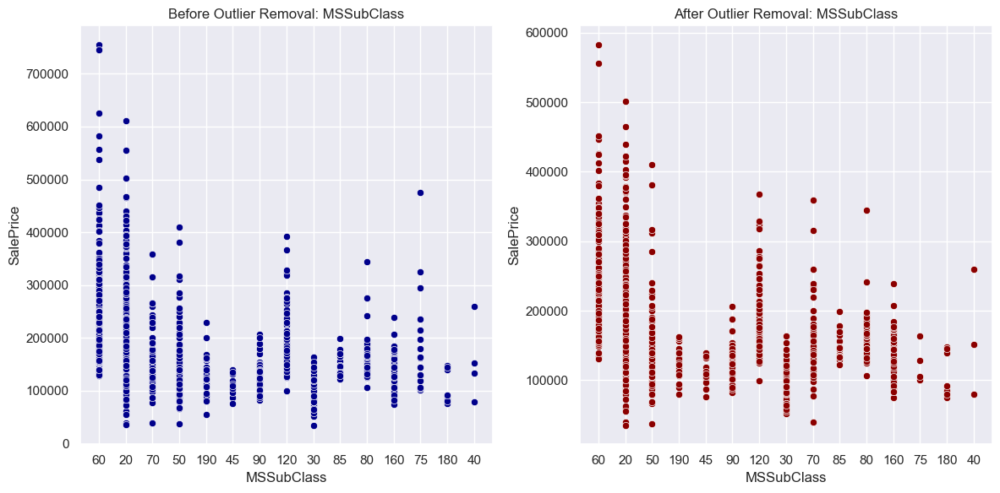

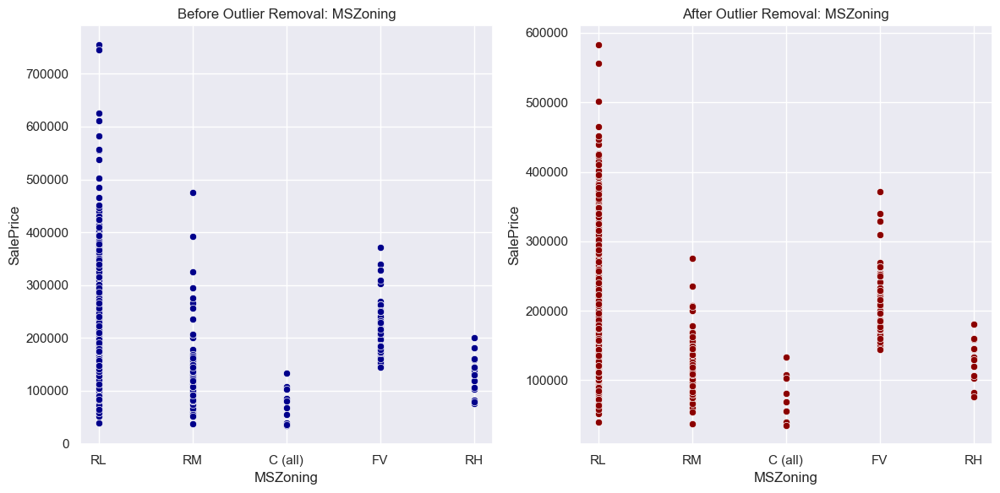

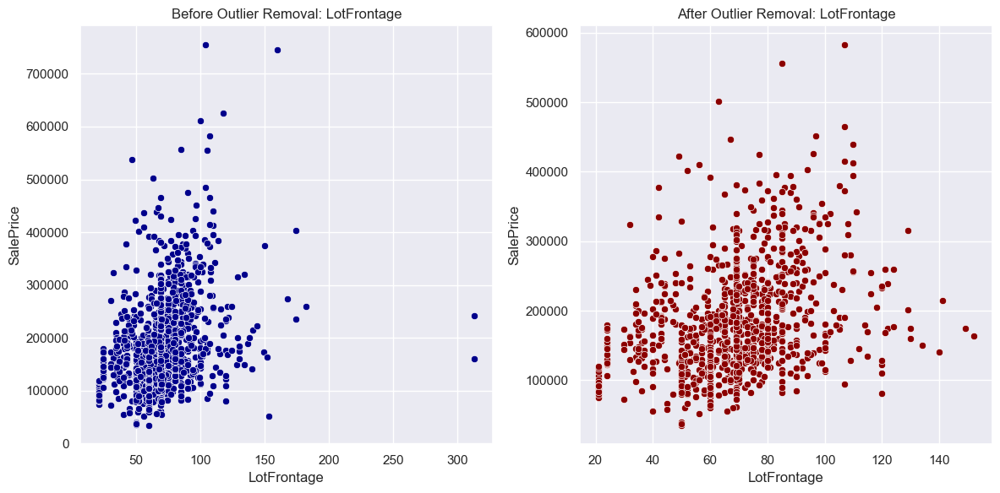

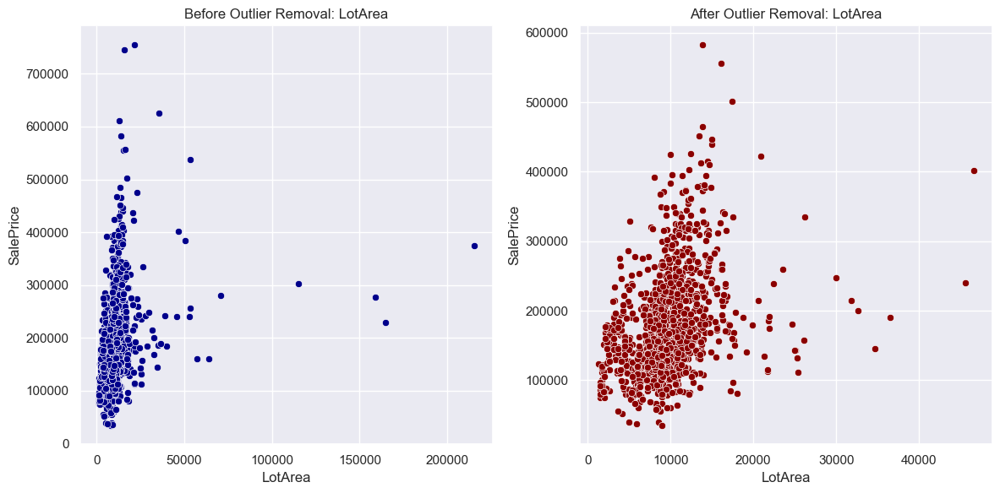

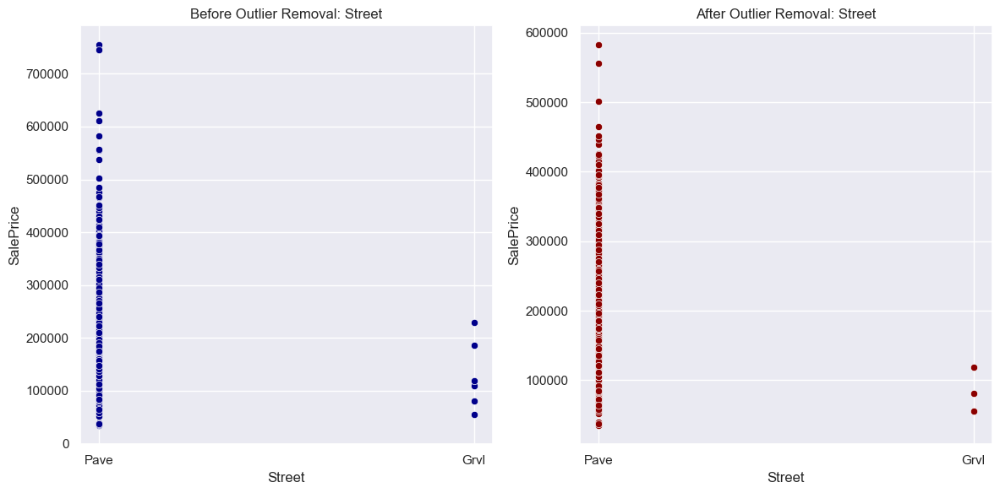

...

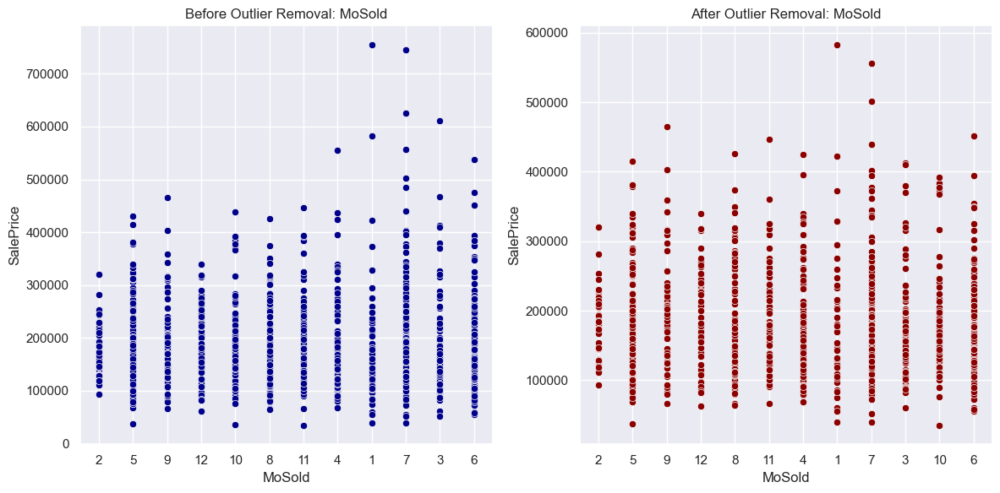

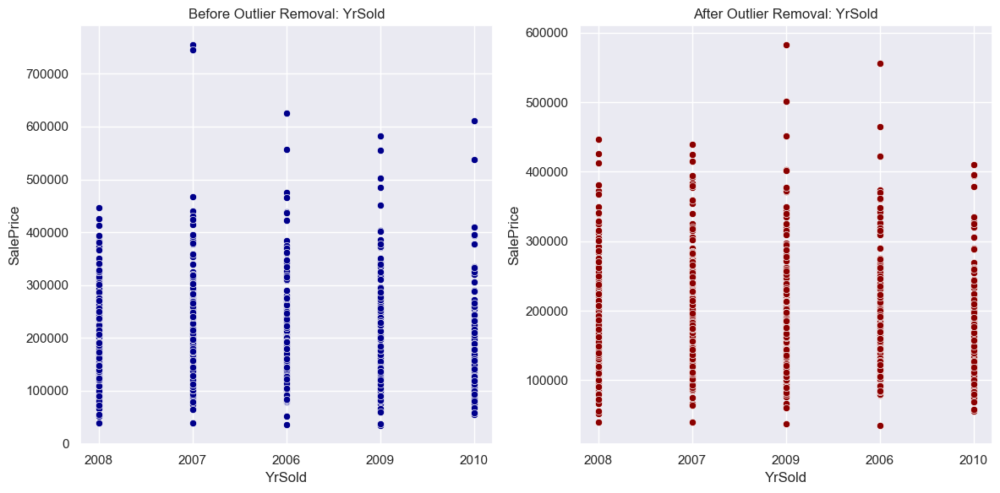

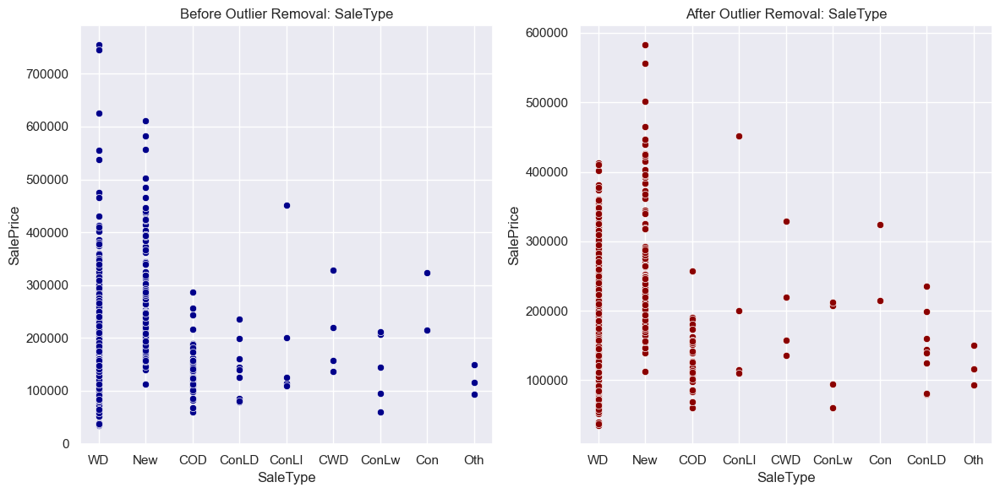

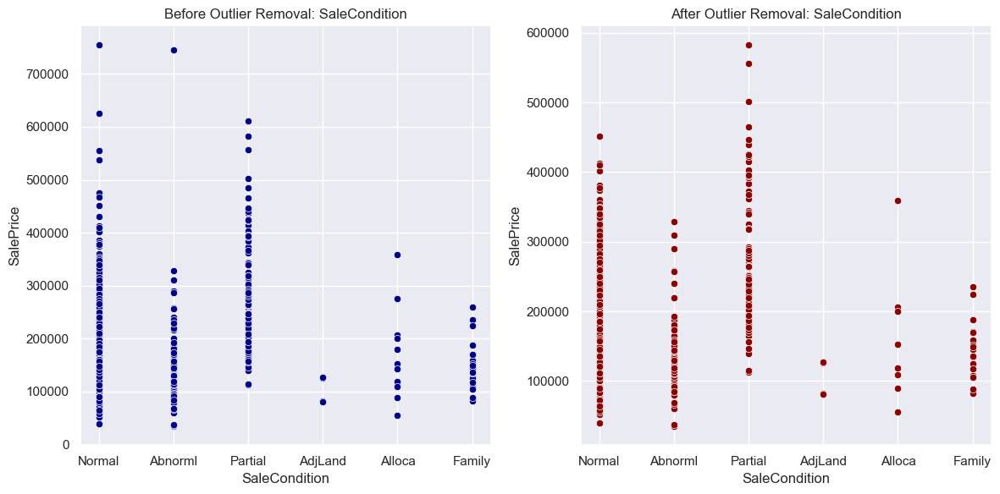

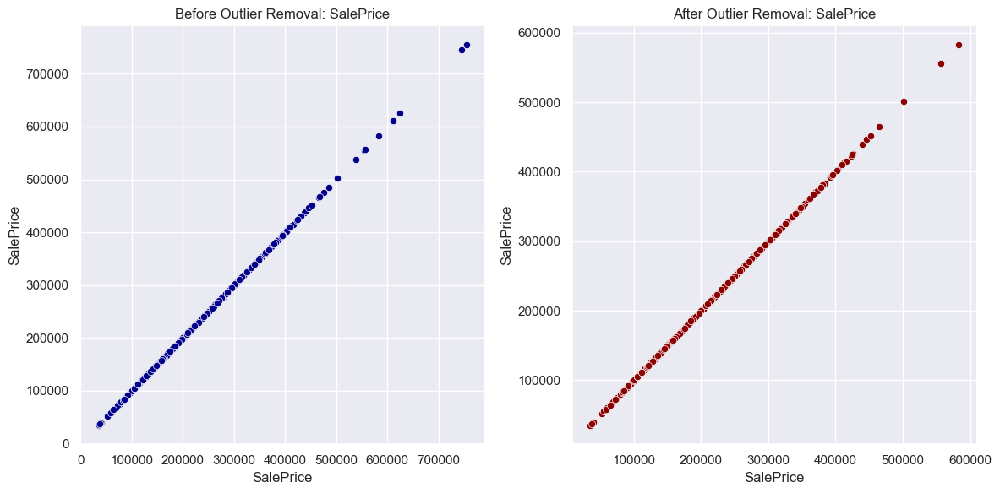

In [57]:
def scatter_comparison(original_data, cleaned_data, target):
    for feature in original_data.columns:
        plt.figure(figsize=(12, 6))
        
        plt.subplot(1, 2, 1)
        sns.scatterplot(x=original_data[feature], y=original_data[target], color='darkblue')
        plt.title(f'Before Outlier Removal: {feature}')
        plt.xlabel(feature)
        plt.ylabel('SalePrice')

        plt.subplot(1, 2, 2)
        sns.scatterplot(x=cleaned_data[feature], y=cleaned_data[target], color='darkred')
        plt.title(f'After Outlier Removal: {feature}')
        plt.xlabel(feature)
        plt.ylabel('SalePrice')

        plt.tight_layout()     
        plt.show()
        

scatter_comparison(df_train_ori, df_train, 'SalePrice')


<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Pearson Correlation </b></div> 

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> 
    • Measure a linear correlation among predictor and response variables
    </span>

In [58]:
df_train_target = df_train.SalePrice

In [59]:
print(f'Predictor Shape: {df_train.shape},  Response Shape: {df_train_target.shape}')

Predictor Shape: (1279, 75),  Response Shape: (1279,)


In [60]:
df_train.corr(numeric_only=True)

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BedroomAbvGr,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,SalePrice
LotFrontage,1.000000,0.511406,0.161178,0.121664,-0.008949,0.153642,0.300960,0.364050,0.038483,-0.053973,0.310095,0.037763,0.289317,0.332315,0.104071,0.131437,-0.014157,0.023109,0.044764,0.019124,0.349288
LotArea,0.511406,1.000000,0.124885,0.184826,-0.010796,0.077801,0.284063,0.370598,0.086264,-0.039187,0.358441,0.077816,0.310627,0.273866,0.198939,0.120088,-0.029193,0.000150,0.063013,0.025414,0.356372
MasVnrArea,0.161178,0.124885,1.000000,0.219747,-0.062910,0.105168,0.338848,0.328877,0.140258,-0.039945,0.375553,0.090376,0.114691,0.363053,0.175178,0.167707,-0.119540,-0.020826,0.053775,-0.050995,0.460181
BsmtFinSF1,0.121664,0.184826,0.219747,1.000000,-0.031292,-0.557156,0.451067,0.380106,-0.180054,-0.031046,0.125227,0.670109,-0.106868,0.256349,0.211837,0.086506,-0.106991,0.006700,0.091925,-0.017371,0.381484
BsmtFinSF2,-0.008949,-0.010796,-0.062910,-0.031292,1.000000,-0.209705,-0.007754,-0.028375,-0.069741,-0.017557,-0.084780,0.082906,0.019184,-0.034456,0.048826,-0.059381,0.026635,-0.009153,0.010847,-0.013057,-0.090707
BsmtUnfSF,0.153642,0.077801,0.105168,-0.557156,-0.209705,1.000000,0.460060,0.349565,-0.030241,-0.016236,0.237599,-0.418753,0.141034,0.185457,0.002280,0.143523,-0.012804,0.012035,-0.021194,-0.066279,0.219137
TotalBsmtSF,0.300960,0.284063,0.338848,0.451067,-0.007754,0.460060,1.000000,0.794400,-0.246731,-0.056299,0.378880,0.278589,0.046978,0.475567,0.244423,0.238487,-0.123111,0.018311,0.078585,-0.096252,0.633920
1stFlrSF,0.364050,0.370598,0.328877,0.380106,-0.028375,0.349565,0.794400,1.000000,-0.285074,-0.056215,0.500202,0.206552,0.124754,0.473900,0.232166,0.192317,-0.108162,0.014009,0.096563,-0.057490,0.606945
2ndFlrSF,0.038483,0.086264,0.140258,-0.180054,-0.069741,-0.030241,-0.246731,-0.285074,1.000000,0.017230,0.687260,-0.165119,0.505570,0.127581,0.078795,0.213667,0.033379,-0.026938,0.003837,-0.021868,0.294857
LowQualFinSF,-0.053973,-0.039187,-0.039945,-0.031046,-0.017557,-0.016236,-0.056299,-0.056215,0.017230,1.000000,-0.012099,-0.052144,-0.069645,-0.006862,-0.038863,0.044663,0.040096,-0.002182,-0.016291,0.096125,-0.044772


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Ensure the shapes of the datasets are consistent </span>

In [61]:
print(f'Training data shape: {df_train.shape}')
print(f'Test data shape: {df_test.shape}')


Training data shape: (1279, 75)
Test data shape: (1459, 75)


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Correlation Heatmap </span>

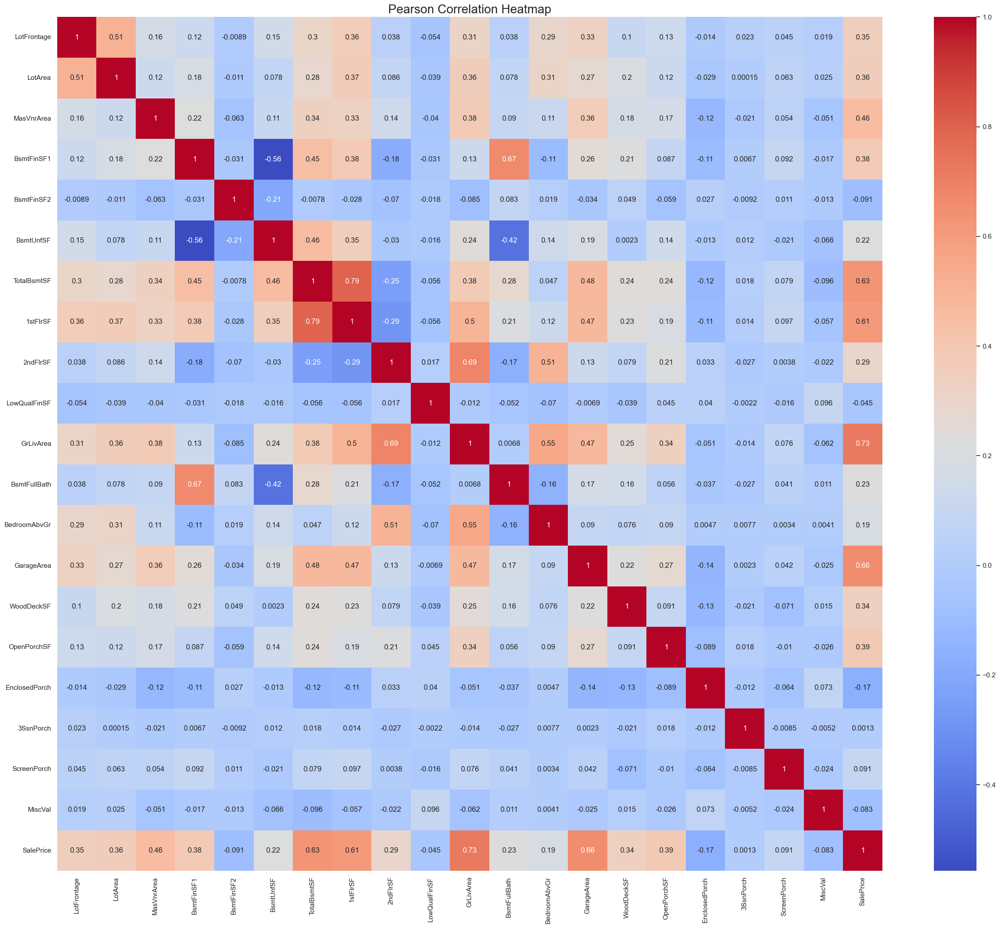

In [62]:
def pearson_correlation(df):
    plt.figure(figsize=(30, 25))
    color = plt.get_cmap('coolwarm')  
    data = sns.heatmap(df.corr(numeric_only=True), cmap=color, annot=True, fmt='.2g')
    plt.title("Pearson Correlation Heatmap", fontsize=20)
    plt.show()

pearson_correlation(df_train)


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Ranking absoulte strong predictor correlations </span>

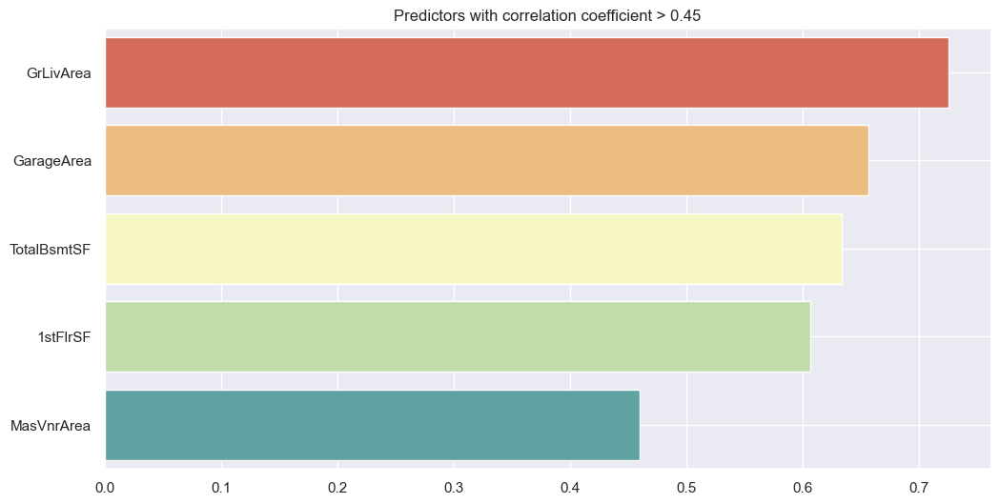

['GrLivArea', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'MasVnrArea']

In [63]:
def top_correlations_bar(df, threshold):
    labels = []
    corr = []
    
    data = abs(df.corr(numeric_only=True)["SalePrice"]).sort_values(ascending=False)
    indices = data.index
    
    for i in range(1, len(indices)):
        if data[indices[i]] >= threshold:
            labels.append(indices[i])
            corr.append(data[i])
            
    sns.barplot(x=corr, y=labels, palette='Spectral')
    plt.title(f'Predictors with correlation coefficient > {threshold}')
    plt.grid(True)
    plt.show()
    return labels

threshold = 0.45
imp_num_features = top_correlations_bar(df_train, threshold)
imp_num_features


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Compute Cramér's V Algorithm </span>

In [64]:
def cramers_v(chi2, n, r, k):
    if n == 0 or min(r-1, k-1) == 0:
        return 0
    return np.sqrt(chi2 / (n * (min(r - 1, k - 1))))

def cramers_v_matrix(df, cols):
    n = len(df)
    matrix = pd.DataFrame(index=cols, columns=cols)

    for col1 in cols:
        for col2 in cols:
            if col1 == col2:
                matrix[col1][col2] = 1.0  
            else:
                contingency_table = pd.crosstab(df[col1], df[col2])
                if contingency_table.shape[0] < 2 or contingency_table.shape[1] < 2:
                    matrix[col1][col2] = 0
                else:
                    chi2, p, dof, expected = chi2_contingency(contingency_table)
                    r, k = contingency_table.shape
                    matrix[col1][col2] = cramers_v(chi2, n, r, k)

    return matrix.astype(float)

categorical_cols = categorical_predictors.columns.to_list()
cramers_v_df = cramers_v_matrix(df_train, categorical_cols)
cramers_v_df.head()

,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,BsmtHalfBath,FullBath,HalfBath,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,PoolArea,MoSold,YrSold,SaleType,SaleCondition
MSSubClass,1.000000,0.348845,0.106168,0.195488,0.169688,0.0,0.127930,0.212772,0.398422,0.150578,0.234838,0.895331,0.927348,0.218274,0.213031,0.468633,0.314862,0.310341,0.231934,0.233583,0.238284,0.299841,0.169838,0.367443,0.356229,0.223133,0.275319,0.259739,0.189564,0.186190,0.263232,0.428279,0.213261,0.132687,0.336469,0.544668,0.541356,0.297898,0.286398,0.157679,0.242417,0.216341,0.348635,0.400810,0.392086,0.304950,0.248252,0.244532,0.321522,0.099533,0.102426,0.089379,0.135580,0.177439
MSZoning,0.348845,1.000000,0.406251,0.172678,0.120995,0.0,0.083311,0.109311,0.645889,0.094039,0.062681,0.196675,0.192119,0.208619,0.174339,0.459473,0.300906,0.095159,0.023229,0.206150,0.214220,0.238867,0.082126,0.237206,0.177688,0.083548,0.088367,0.149831,0.075672,0.060042,0.129814,0.261675,0.116176,0.057253,0.191291,0.147935,0.104024,0.183413,0.159082,0.064382,0.144580,0.134712,0.231148,0.418316,0.191442,0.154335,0.123276,0.103167,0.201186,0.014645,0.091844,0.047006,0.155264,0.150134
Street,0.106168,0.406251,1.000000,0.035419,0.140446,0.0,0.029469,0.073642,0.210790,0.018466,0.004304,0.081694,0.094913,0.134848,0.083078,0.402082,0.303812,0.019790,0.004304,0.055253,0.057570,0.382835,0.039079,0.056451,0.025144,0.016240,0.068874,0.044370,0.017674,0.006846,0.075569,0.021129,0.054950,0.011579,0.053314,0.036958,0.010568,0.099145,0.059525,0.012691,0.049060,0.049060,0.156473,0.364417,0.064459,0.072769,0.061602,0.061513,0.056406,0.001919,0.064055,0.047118,0.201527,0.189835
LotShape,0.195488,0.172678,0.035419,1.000000,0.104109,0.0,0.220396,0.051301,0.275535,0.144987,0.056058,0.104521,0.105076,0.131257,0.105356,0.340854,0.251145,0.050736,0.034293,0.125161,0.137382,0.115705,0.048345,0.151464,0.158197,0.073187,0.100997,0.098555,0.077821,0.056731,0.086416,0.139913,0.155046,0.065153,0.109993,0.097360,0.064083,0.097763,0.096197,0.033990,0.122217,0.138936,0.158797,0.318945,0.152027,0.129526,0.079467,0.071829,0.100149,0.020441,0.079305,0.046116,0.068736,0.050321
LandContour,0.169688,0.120995,0.140446,0.104109,1.000000,0.0,0.050711,0.404578,0.340975,0.057728,0.089096,0.074603,0.095978,0.206256,0.146459,0.415853,0.255999,0.147016,0.097418,0.136419,0.146300,0.149147,0.043924,0.120413,0.112191,0.094679,0.162862,0.107593,0.062599,0.025130,0.085259,0.091767,0.069157,0.041183,0.114353,0.062982,0.031247,0.100404,0.132452,0.049370,0.048601,0.078603,0.124646,0.360937,0.102093,0.088694,0.070544,0.041172,0.122340,0.008627,0.116846,0.056026,0.075283,0.151584


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Heatmap of Cramér's V </span>

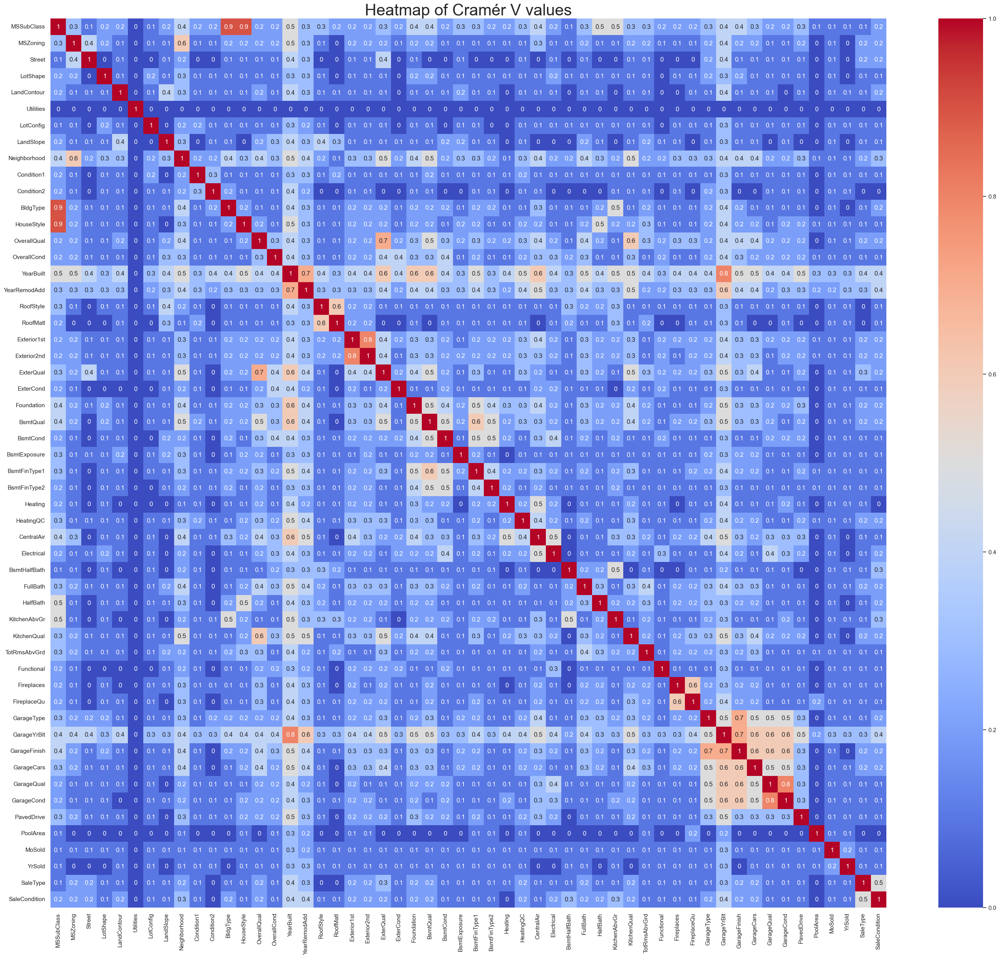

In [65]:
def plot_cramers_heatmap(df):
    plt.figure(figsize=(35, 30))
    sns.heatmap(round(df, 1), annot=True, cmap="coolwarm")
    plt.title("Heatmap of Cramér V values", fontsize=30)
    plt.show()

plot_cramers_heatmap(cramers_v_df)

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> 
    • Rank feature correlations
    </span>

<Figure size 3000x2500 with 0 Axes>

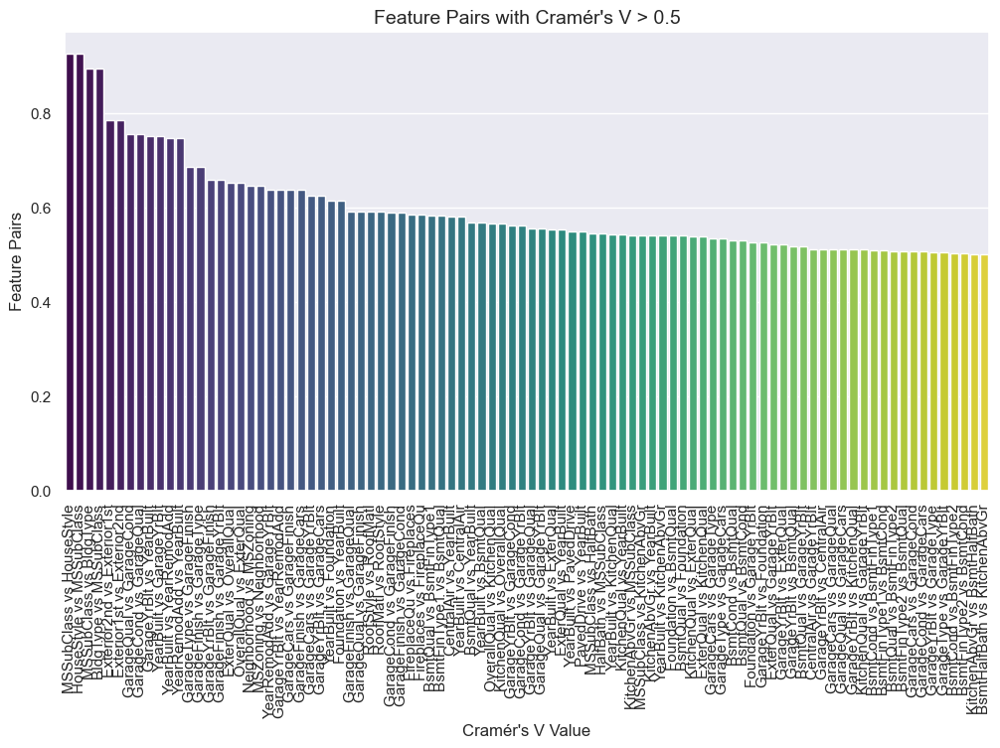

In [66]:
def plot_correlations_bar(df, threshold):
    plt.figure(figsize=(30, 25))
    selected_features_with_values = []

    for col1 in df.columns:
        for col2 in df.columns:
            if col1 != col2 and cramers_v_df[col1][col2] > threshold:
                selected_features_with_values.append((f'{col1} vs {col2}', df[col1][col2]))

    selected_df = pd.DataFrame(selected_features_with_values, columns=['Feature Pair', 'Cramér\'s V']).drop_duplicates()
    selected_df = selected_df.sort_values(by='Cramér\'s V', ascending=False)

    plt.figure(figsize=fig_size)
    sns.barplot(y='Cramér\'s V', x='Feature Pair', data=selected_df, palette='viridis')

    plt.title('Feature Pairs with Cramér\'s V > 0.5', fontsize=14)
    plt.xlabel('Cramér\'s V Value', fontsize=12)
    plt.ylabel('Feature Pairs', fontsize=12)
    plt.xticks(rotation=90)
    plt.show()

threshold = 0.5 
plot_correlations_bar(cramers_v_df, threshold)


In [67]:
def get_cat_features(df, threshold):
    cat_features = []

    for col1 in df.columns:
        for col2 in df.columns:
            if col1 != col2 and df[col1][col2] > threshold:
                if col1 not in cat_features:
                    cat_features.append(col1)
                if col2 not in cat_features:
                    cat_features.append(col2)

    return cat_features

threshold = 0.5 
imp_cat_features = get_cat_features(cramers_v_df, threshold)
imp_cat_features

['MSSubClass',
 'BldgType',
 'HouseStyle',
 'HalfBath',
 'KitchenAbvGr',
 'MSZoning',
 'Neighborhood',
 'OverallQual',
 'ExterQual',
 'KitchenQual',
 'YearBuilt',
 'YearRemodAdd',
 'Foundation',
 'BsmtQual',
 'CentralAir',
 'GarageYrBlt',
 'PavedDrive',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'BsmtCond',
 'BsmtFinType1',
 'BsmtFinType2',
 'BsmtHalfBath',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageCars',
 'GarageQual',
 'GarageCond']

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> 
    • Merge all the important features
    </span>

In [68]:
all_imp_features = imp_cat_features

for feature in imp_num_features:
  all_imp_features.append(feature)

all_imp_features

['MSSubClass',
 'BldgType',
 'HouseStyle',
 'HalfBath',
 'KitchenAbvGr',
 'MSZoning',
 'Neighborhood',
 'OverallQual',
 'ExterQual',
 'KitchenQual',
 'YearBuilt',
 'YearRemodAdd',
 'Foundation',
 'BsmtQual',
 'CentralAir',
 'GarageYrBlt',
 'PavedDrive',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'BsmtCond',
 'BsmtFinType1',
 'BsmtFinType2',
 'BsmtHalfBath',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageCars',
 'GarageQual',
 'GarageCond',
 'GrLivArea',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'MasVnrArea']

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Truncating predictors with  insignificant correlations </span>

In [69]:
test_id = df_test['Id']

df_train = df_train[all_imp_features]
df_test = df_test[all_imp_features]

print(df_train.shape, df_test.shape)

(1279, 37) (1459, 37)


<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Transformation and Pipeline setup </b></div> 

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Setup X and Y </span>

In [70]:
print(df_train.shape, df_train_target.shape)

(1279, 37) (1279,)


In [71]:
X = df_train
y = df_train_target

In [72]:
numerical_features = X.select_dtypes(['float64', 'int64']).columns.tolist()


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Ordinal and Nominal features </span>

In [73]:
X.select_dtypes(['object']).columns

Index(['MSSubClass', 'BldgType', 'HouseStyle', 'HalfBath', 'KitchenAbvGr',
       'MSZoning', 'Neighborhood', 'OverallQual', 'ExterQual', 'KitchenQual',
       'YearBuilt', 'YearRemodAdd', 'Foundation', 'BsmtQual', 'CentralAir',
       'GarageYrBlt', 'PavedDrive', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2',
       'BsmtHalfBath', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond'],
      dtype='object')

In [74]:
ordinal_features = ['MSSubClass', 'OverallQual', 'ExterQual', 'KitchenQual', 'YearBuilt', 'YearRemodAdd', 'BsmtQual',  
                   'GarageYrBlt', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageQual', 'GarageCond']

oh_features = ['BldgType', 'HouseStyle', 'HalfBath', 'KitchenAbvGr', 'MSZoning', 'Neighborhood', 'Foundation', 'CentralAir', 
               'PavedDrive', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'BsmtHalfBath', 'Fireplaces', 'GarageType', 'GarageFinish', 
               'GarageType', 'GarageFinish', 'GarageCars']


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> 
    • Data allocations 
</span>

In [77]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1)


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> 
    • Setup pipelines
</span>

In [78]:
num_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  
    ('scaler', MinMaxScaler()) 
])

ord_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), 
    ('onehot', OrdinalEncoder(handle_unknown='use_encoded_value',unknown_value=-1))  
])

oh_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), 
    ('onehot', OneHotEncoder(drop='if_binary',handle_unknown='ignore',sparse_output=False))  
])


In [79]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_pipeline, numerical_features),
        ('ord', ord_pipeline, ordinal_features),
        ('oh', oh_pipeline, oh_features)
    ])


<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Performance visualizer methods </span>

In [87]:
def residual_scatter(y_val, y_prediction):
    fig, ax1 = plt.subplots(figsize=fig_size)
    sns.residplot(x=y_val, y=y_prediction, color='maroon', lowess=True, ax=ax1)
    plt.grid(True)
    plt.title(f"Residual plot for {applied_model}")
    plt.show()

    fig, ax2 = plt.subplots(figsize=fig_size)
    sns.scatterplot(x=y_val, y=y_prediction, color='darkgreen', ax=ax2)
    line = mlines.Line2D([0, 1], [0, 1], color='red')
    transform = ax2.transAxes
    line.set_transform(transform)
    ax2.add_line(line)
    plt.legend(['Validation', 'Training'])
    plt.grid(True)
    plt.title(f"Residual plot for {applied_model}")
    plt.show()
    
def residual_dist(residuals, applied_model):
    fig, ax = plt.subplots(figsize=fig_size)
    sns.distplot(residuals, color='darkblue')
    plt.grid(True)
    plt.title(f"Distribution plot for {applied_model}")
    plt.show()


<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> 1. Linear Regression </b></div> 

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply Grid Search and observe the ideal parameters </span>

In [81]:
param_grid = {
            'fit_intercept': [True, False],
            'positive': [True, False]
        }

lr_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('model', GridSearchCV(estimator=LinearRegression(),param_grid=param_grid, 
                           cv=3, verbose=0, scoring='neg_mean_squared_log_error'))  
])

lr_pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                   'Foundation', 'CentralAir',
                                                   'PavedDrive', 'RoofStyle',
                                                   'RoofMatl', 'Exterior1st',
                                                   'Exterior2nd',
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 GridSearchCV(cv=3, estimator=LinearRegression(),
                              param_grid={'fit_intercept': [True, False],
                                          'positive': [True, False]},
                              scoring='neg_mean_squared_log_error'))])

In [82]:
linear_model = lr_pipeline.named_steps['model']

best_params = linear_model.best_params_
best_score = linear_model.best_score_

print(f'Best parameters: {best_params}')
print(f'Best score: {best_score}')

Best parameters: {'fit_intercept': False, 'positive': True}
Best score: -0.024168023808758904


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply the optimal hyperparameters </span>

In [110]:
lr_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('model', LinearRegression(fit_intercept=False, positive=True))  
])

lr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                                                 sparse_output=False))]),
                                                  ['BldgType', 'HouseStyle',
                                                   'HalfBath', 'KitchenAbvGr',
                                                   'MSZoning', 'Neighborhood',
                                                   'Foundation', 'CentralAir',
                                                   'PavedDrive', 'RoofStyle',
                                                   'RoofMatl', 'Exterior1st',
                                                   'Exterior2nd',
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 LinearRegression(fit_intercept=False, positive=True))])

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Model evaluations </span>

In [111]:
lr_train_score = lr_pipeline.score(X_train, y_train)
lr_val_score = lr_pipeline.score(X_val, y_val)

y_prediction = lr_pipeline.predict(X_val)
residuals = y_val - y_prediction

print(f'Training score: {lr_train_score:.2f}')
print(f'Validation score: {lr_val_score:.2f}')

lr_rmse = mean_squared_error(np.log2(y_val), np.log2(y_prediction), squared=False)
lr_mae = mean_absolute_error(np.log2(y_val), np.log2(y_prediction))

print(f'RMSE: {lr_rmse:.2f}')
print(f'MAE: {lr_mae:.2f}')


Training score: 0.88
Validation score: 0.88
RMSE: 0.21
MAE: 0.14


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Performance breakdown </span>

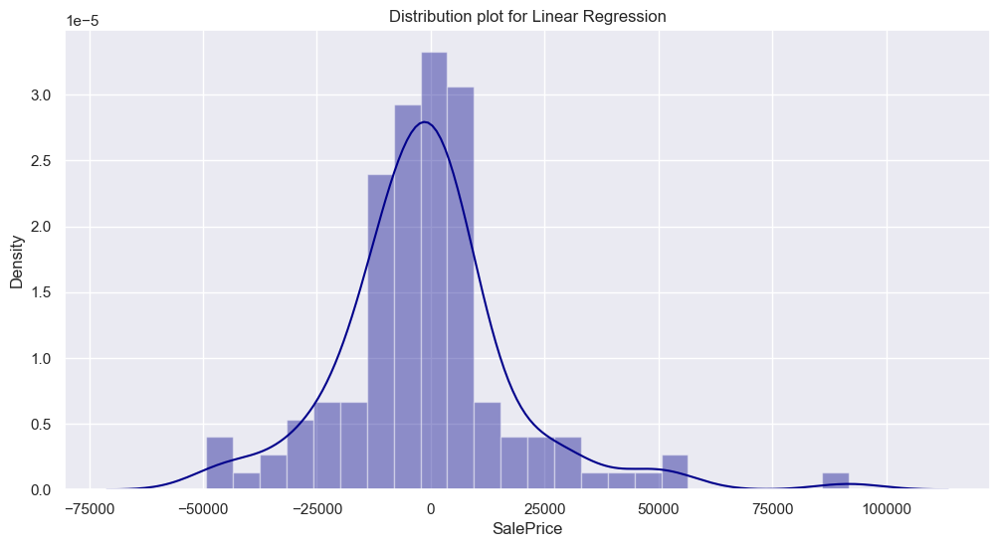

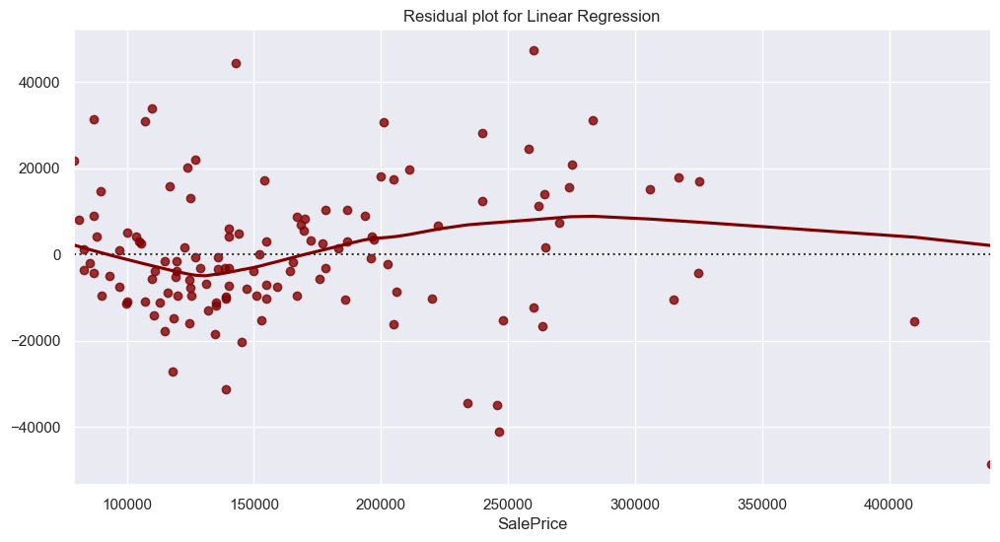

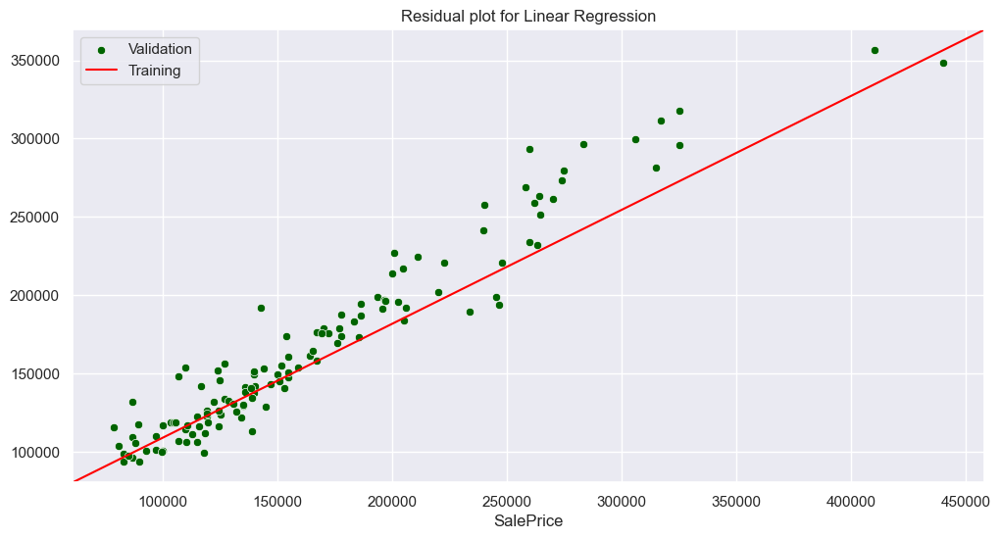

In [114]:
applied_model = 'Linear Regression'

residual_dist(residuals, applied_model)
residual_scatter(y_val, y_prediction)

<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> 2. Random Forest </b></div> 

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply Grid Search and observe the ideal parameters </span>

In [89]:
param_grid = {
            'n_estimators': [100, 150],
            'min_samples_split': [2, 5, 8],
            'min_samples_leaf': [1, 2, 3],
            'max_depth': [None, 5, 10]
        }

rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('model', GridSearchCV(estimator=RandomForestRegressor(criterion='squared_error'),param_grid=param_grid, 
                           cv=3, verbose=0, scoring='neg_mean_squared_log_error'))  
])

rf_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                   'RoofMatl', 'Exterior1st',
                                                   'Exterior2nd',
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 GridSearchCV(cv=3, estimator=RandomForestRegressor(),
                              param_grid={'max_depth': [None, 5, 10],
                                          'min_samples_leaf': [1, 2, 3],
                                          'min_samples_split': [2, 5, 8],
                                          'n_estimators': [100, 150]},
                              scoring='neg_mean_squared_log_error'))])

In [90]:
rf_model = rf_pipeline.named_steps['model']  

best_params = rf_model.best_params_ 
best_score = rf_model.best_score_  

print(f'Best parameters: {best_params}') 
print(f'Best score: {best_score}')

Best parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}
Best score: -0.022463801146226824


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply the ideal hyperparameters </span>

In [112]:
rf_pipeline = Pipeline(steps=[     
    ('preprocessor', preprocessor),       
    ('model', RandomForestRegressor(max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150))   
])

rf_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                                                 sparse_output=False))]),
                                                  ['BldgType', 'HouseStyle',
                                                   'HalfBath', 'KitchenAbvGr',
                                                   'MSZoning', 'Neighborhood',
                                                   'Foundation', 'CentralAir',
                                                   'PavedDrive', 'RoofStyle',
                                                   'RoofMatl', 'Exterior1st',
                                                   'Exterior2nd',
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 RandomForestRegressor(min_samples_leaf=2, n_estimators=150))])

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Model evaluations </span>

In [113]:
rf_train_score = rf_pipeline.score(X_train, y_train)
rf_val_score = rf_pipeline.score(X_val, y_val)

y_prediction = rf_pipeline.predict(X_val)
residuals = y_val - y_prediction

print(f'Training score: {rf_train_score:.2f}')
print(f'Validation score: {rf_val_score:.2f}')

rf_rmse = mean_squared_error(np.log2(y_val), np.log2(y_prediction), squared=False)
rf_mae = mean_absolute_error(np.log2(y_val), np.log2(y_prediction))

print(f'RMSE: {rf_rmse:.2f}')
print(f'MAE: {rf_mae:.2f}')

Training score: 0.97
Validation score: 0.92
RMSE: 0.17
MAE: 0.12


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Performance breakdown </span>

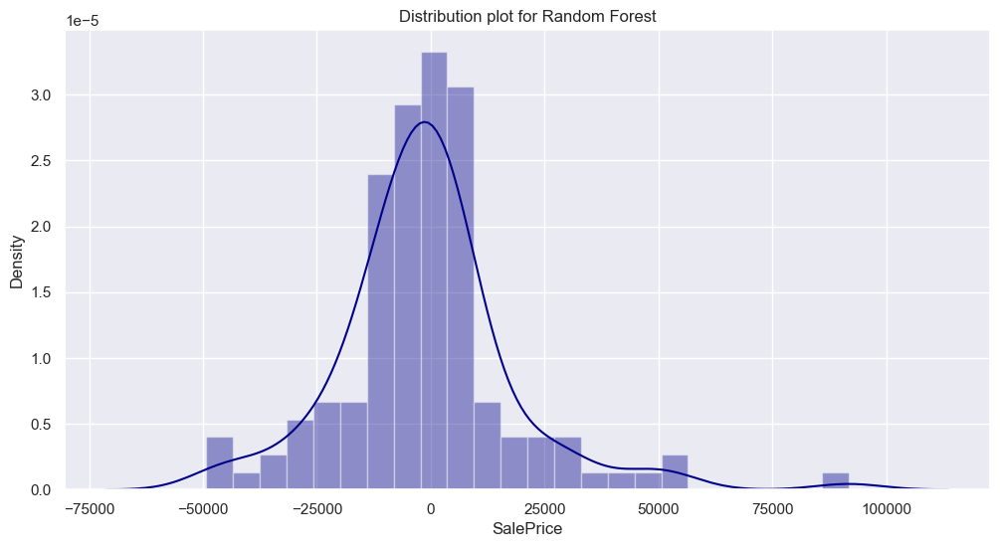

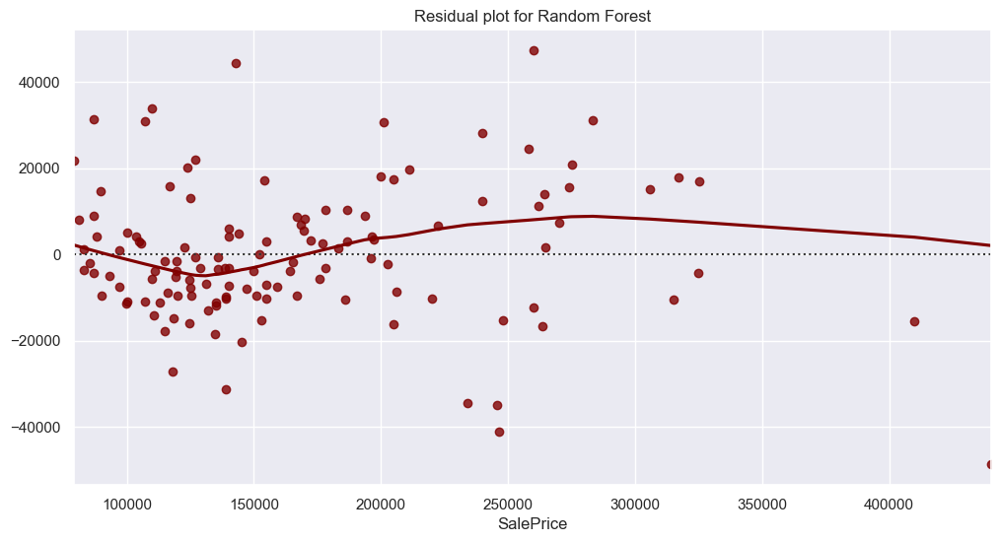

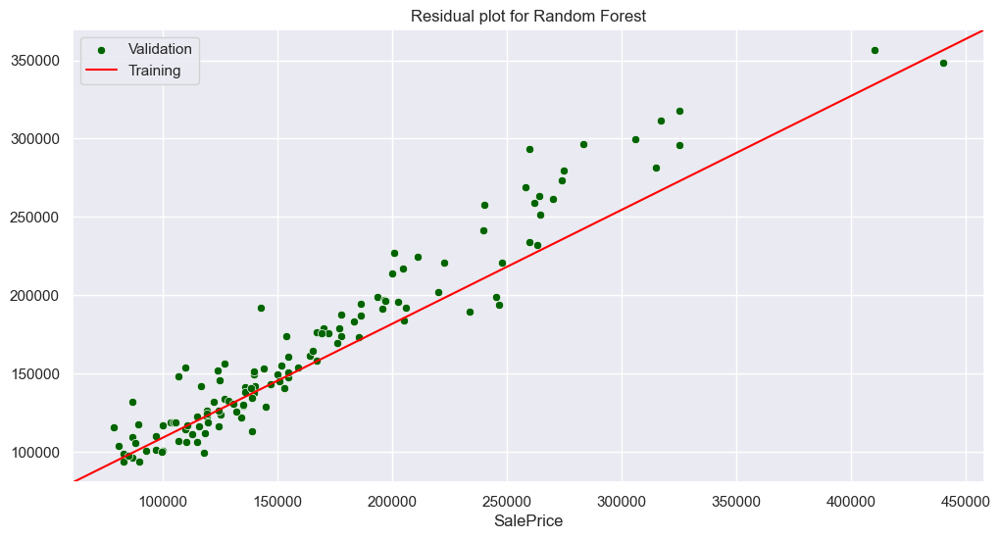

In [115]:
applied_model = 'Random Forest'

residual_dist(residuals, applied_model) 
residual_scatter(y_val, y_prediction)

<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> 3. Gradient Boosting Regression </b></div> 

<span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply Grid Search and observe the ideal parameters </span>

In [94]:
param_grid = {
            'learning_rate': [0.1, 0.15, 0.2],
            'n_estimators': [100, 200],
            'min_samples_split': [3, 5],
            'max_depth': [3, 5],
            'alpha': [0.3, 0.6]
        }

gbr_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('model', GridSearchCV(estimator=GradientBoostingRegressor(min_samples_leaf=1, loss='squared_error'),param_grid=param_grid, 
                           cv=3, verbose=0, scoring='neg_mean_squared_log_error'))  
])

gbr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                   'Exterior2nd',
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 GridSearchCV(cv=3, estimator=GradientBoostingRegressor(),
                              param_grid={'alpha': [0.3, 0.6],
                                          'learning_rate': [0.1, 0.15, 0.2],
                                          'max_depth': [3, 5],
                                          'min_samples_split': [3, 5],
                                          'n_estimators': [100, 200]},
                              scoring='neg_mean_squared_log_error'))])

In [95]:
gbr_model = gbr_pipeline.named_steps['model']  

best_params = gbr_model.best_params_ 
best_score = gbr_model.best_score_  

print(f'Best parameters: {best_params}') 
print(f'Best score: {best_score}')


Best parameters: {'alpha': 0.6, 'learning_rate': 0.1, 'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 200}
Best score: -0.019401158655918717


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply the ideal hyperparameters </span>

In [116]:
gbr_pipeline = Pipeline(steps=[     
    ('preprocessor', preprocessor),       
    ('model', GradientBoostingRegressor(alpha=0.6, learning_rate=0.1, max_depth=3, min_samples_split=5, n_estimators=200, 
                                       min_samples_leaf=1))   
])

gbr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                  ['BldgType', 'HouseStyle',
                                                   'HalfBath', 'KitchenAbvGr',
                                                   'MSZoning', 'Neighborhood',
                                                   'Foundation', 'CentralAir',
                                                   'PavedDrive', 'RoofStyle',
                                                   'RoofMatl', 'Exterior1st',
                                                   'Exterior2nd',
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 GradientBoostingRegressor(alpha=0.6, min_samples_split=5,
                                           n_estimators=200))])

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Model evaluations </span>

In [117]:
gbr_train_score = gbr_pipeline.score(X_train, y_train)
gbr_val_score = gbr_pipeline.score(X_val, y_val)

y_prediction = gbr_pipeline.predict(X_val)
residuals = y_val - y_prediction

print(f'Training score: {gbr_train_score:.2f}')
print(f'Validation score: {gbr_val_score:.2f}')

gbr_rmse = mean_squared_error(np.log2(y_val), np.log2(y_prediction), squared=False)
gbr_mae = mean_absolute_error(np.log2(y_val), np.log2(y_prediction))

print(f'RMSE: {gbr_rmse:.2f}')
print(f'MAE: {gbr_mae:.2f}')

Training score: 0.97
Validation score: 0.93
RMSE: 0.16
MAE: 0.11


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Performance breakdown </span>

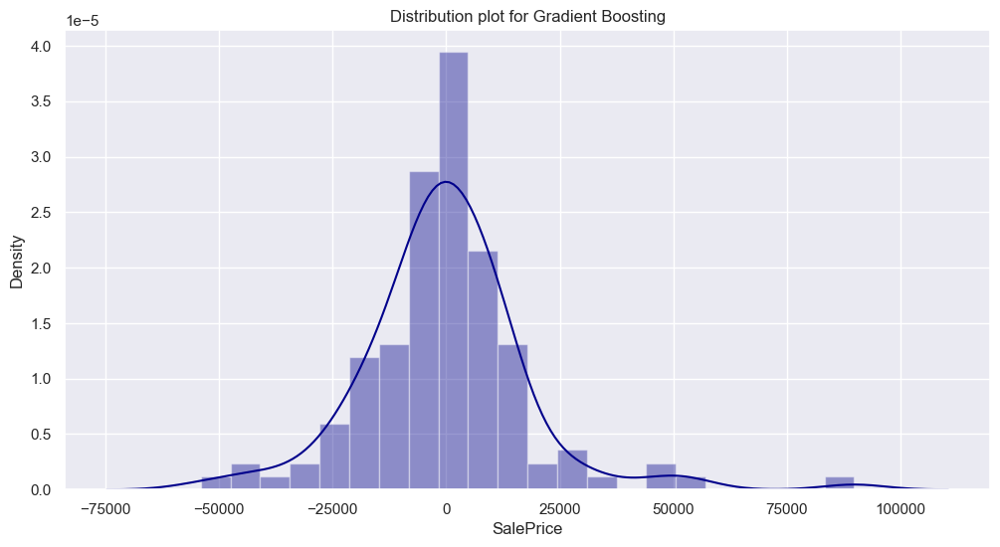

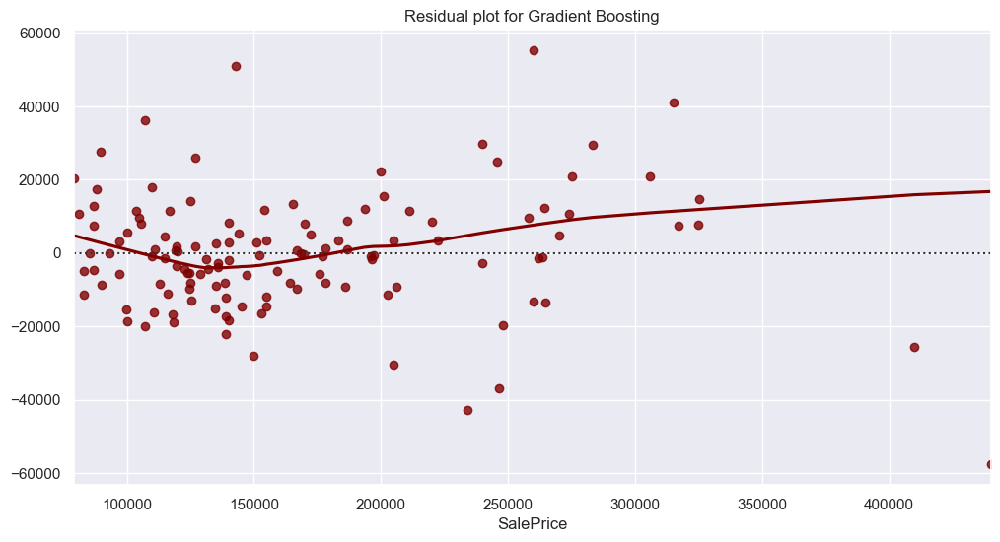

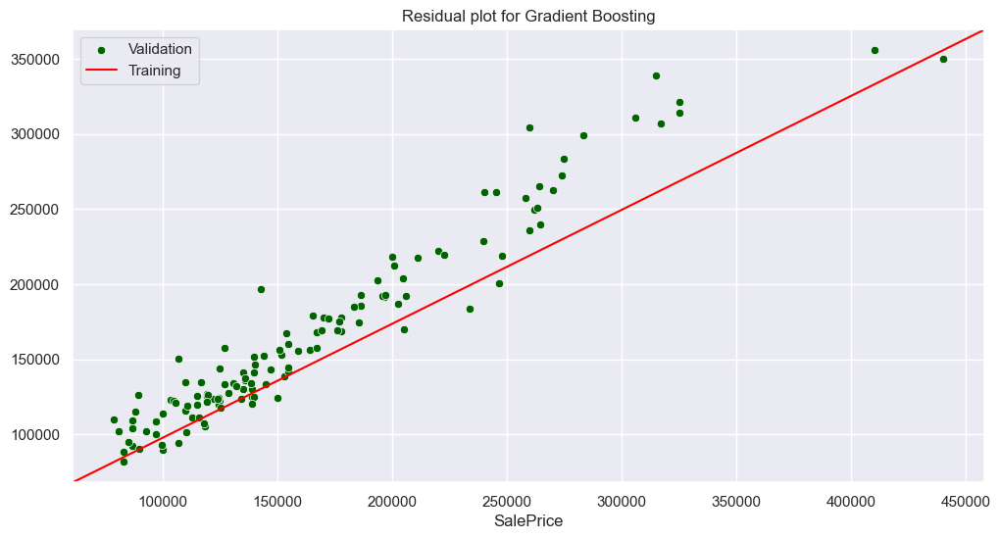

In [118]:
applied_model = 'Gradient Boosting'

residual_dist(residuals, applied_model) 
residual_scatter(y_val, y_prediction)

<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> 4. Poisson Regressor </b></div> 

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply Grid Search CV </span>

In [99]:
param_grid = {
            'alpha': [0, 1, 2],
            'fit_intercept': [True, False],
            'solver': ['lbfgs', 'newton-cholesky', 'lbfgs'],
            'max_iter': [50, 100, 150],
            'warm_start': [True, False]
        }

poi_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('model', GridSearchCV(estimator=PoissonRegressor(),param_grid=param_grid, 
                           cv=3, verbose=0, scoring='neg_mean_squared_log_error'))  
])

poi_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 GridSearchCV(cv=3, estimator=PoissonRegressor(),
                              param_grid={'alpha': [0, 1, 2],
                                          'fit_intercept': [True, False],
                                          'max_iter': [50, 100, 150],
                                          'solver': ['lbfgs', 'newton-cholesky',
                                                     'lbfgs'],
                                          'warm_start': [True, False]},
                              scoring='neg_mean_squared_log_error'))])

In [100]:
poi_model = poi_pipeline.named_steps['model']  

best_params = poi_model.best_params_ 
best_score = poi_model.best_score_  

print(f'Best parameters: {best_params}') 
print(f'Best score: {best_score}')

Best parameters: {'alpha': 2, 'fit_intercept': True, 'max_iter': 50, 'solver': 'newton-cholesky', 'warm_start': True}
Best score: -0.018630311670656225


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply the ideal hyperparameters </span>

In [119]:
poi_pipeline = Pipeline(steps=[     
    ('preprocessor', preprocessor),       
    ('model', PoissonRegressor(alpha=2, fit_intercept=True, max_iter=50, solver='newton-cholesky', warm_start=True))   
])

poi_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                  ['BldgType', 'HouseStyle',
                                                   'HalfBath', 'KitchenAbvGr',
                                                   'MSZoning', 'Neighborhood',
                                                   'Foundation', 'CentralAir',
                                                   'PavedDrive', 'RoofStyle',
                                                   'RoofMatl', 'Exterior1st',
                                                   'Exterior2nd',
                                                   'BsmtHalfBath', 'Fireplaces',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageType', 'GarageFinish',
                                                   'GarageCars'])])),
                ('model',
                 PoissonRegressor(alpha=2, max_iter=50,
                                  solver='newton-cholesky', warm_start=True))])

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Model evaluations </span>

In [120]:
poi_train_score = poi_pipeline.score(X_train, y_train)
poi_val_score = poi_pipeline.score(X_val, y_val)

y_prediction = poi_pipeline.predict(X_val)
residuals = y_val - y_prediction

print(f'Training score: {poi_train_score:.2f}')
print(f'Validation score: {poi_val_score:.2f}')

poi_rmse = mean_squared_error(np.log2(y_val), np.log2(y_prediction), squared=False)
poi_mae = mean_absolute_error(np.log2(y_val), np.log2(y_prediction))

print(f'RMSE: {poi_rmse:.2f}')
print(f'MAE: {poi_mae:.2f}')

Training score: 0.93
Validation score: 0.85
RMSE: 0.22
MAE: 0.14


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Performance breakdown </span>

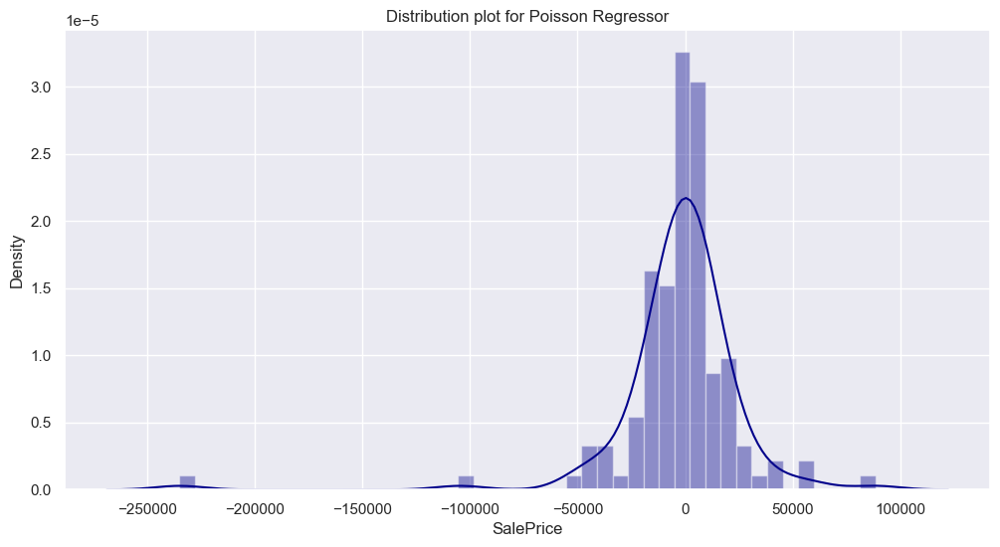

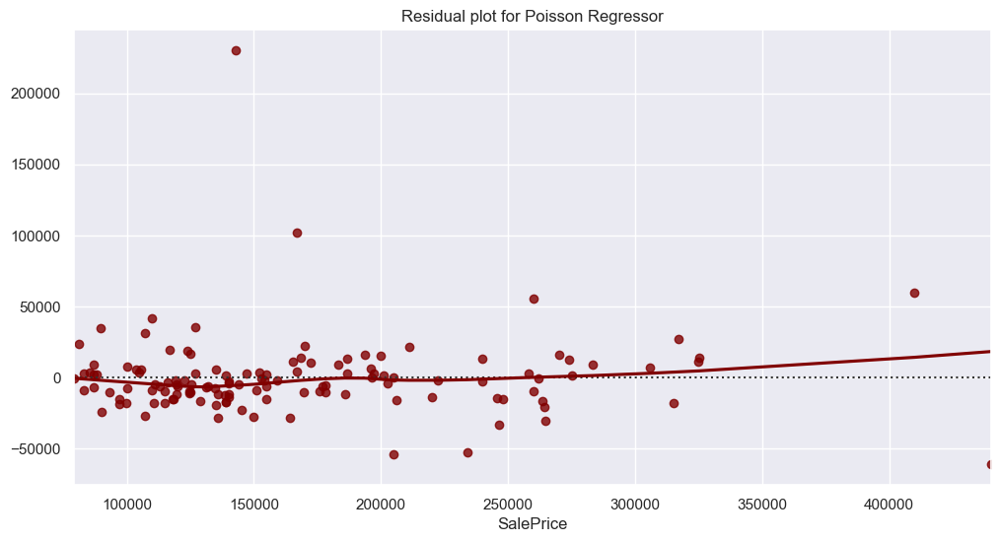

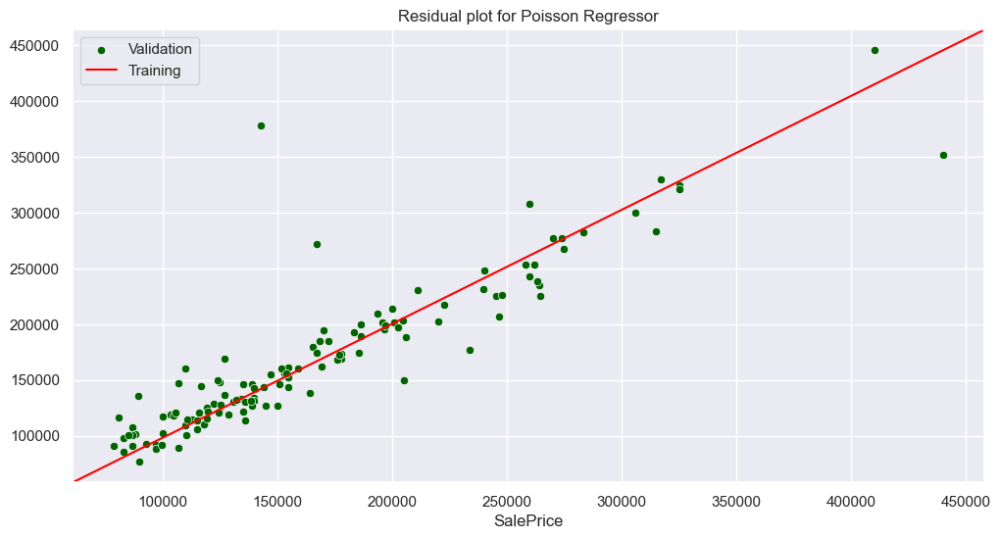

In [121]:
applied_model = 'Poisson Regressor'

residual_dist(residuals, applied_model) 
residual_scatter(y_val, y_prediction)

<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> 5. Extreme Gradient Boosting  </b></div> 

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply Grid Search and observe the ideal parameters </span>

In [104]:
param_grid = {
            'eta': [0.1, 0.3, 0.7],
            'max_depth': [4, 6, 8],
            'min_child_weight': [0, 1],
            'subsample': [0, 0.5, 1]
        }

xgb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  
    ('model', GridSearchCV(estimator=XGBRegressor(),param_grid=param_grid, 
                           cv=3, verbose=0, scoring='neg_mean_squared_log_error'))  
])

xgb_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                                                     max_cat_to_onehot=None,
                                                     max_delta_step=None,
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=None, ...),
                              param_grid={'eta': [0.1, 0.3, 0.7],
                                          'max_depth': [4, 6, 8],
                                          'min_child_weight': [0, 1],
                                          'subsample': [0, 0.5, 1]},
                              scoring='neg_mean_squared_log_error'))])

In [105]:
xgb_model = xgb_pipeline.named_steps['model']  

best_params = xgb_model.best_params_ 
best_score = xgb_model.best_score_  

print(f'Best parameters: {best_params}') 
print(f'Best score: {best_score}')

Best parameters: {'eta': 0.1, 'max_depth': 4, 'min_child_weight': 0, 'subsample': 0.5}
Best score: -0.018848199322659433


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Apply the ideal hyperparameters </span>

In [122]:
xgb_pipeline = Pipeline(steps=[     
    ('preprocessor', preprocessor),       
    ('model', XGBRegressor(eta=0.1, max_depth=4, min_child_weight=0, subsample=0.5))   
])

xgb_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['GrLivArea', 'GarageArea',
                                                   'TotalBsmtSF', '1stFlrSF',
                                                   'MasVnrArea']),
                                                 ('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                  unknow...
                              eval_metric=None, feature_types=None, gamma=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=4, max_leaves=None, min_child_weight=0,
                              missing=nan, monotone_constraints=None,
                              multi_strategy=None, n_estimators=None,
                              n_jobs=None, num_parallel_tree=None, ...))])

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Model evaluations </span>

In [123]:
xgb_train_score = xgb_pipeline.score(X_train, y_train)
xgb_val_score = xgb_pipeline.score(X_val, y_val)

y_prediction = xgb_pipeline.predict(X_val)
residuals = y_val - y_prediction

print(f'Training score: {xgb_train_score:.2f}')
print(f'Validation score: {xgb_val_score:.2f}')

xgb_rmse = mean_squared_error(np.log2(y_val), np.log2(y_prediction), squared=False)
xgb_mae = mean_absolute_error(np.log2(y_val), np.log2(y_prediction))

print(f'RMSE: {xgb_rmse:.2f}')
print(f'MAE: {xgb_mae:.2f}')

Training score: 0.97
Validation score: 0.94
RMSE: 0.15
MAE: 0.11


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Performance breakdown </span>

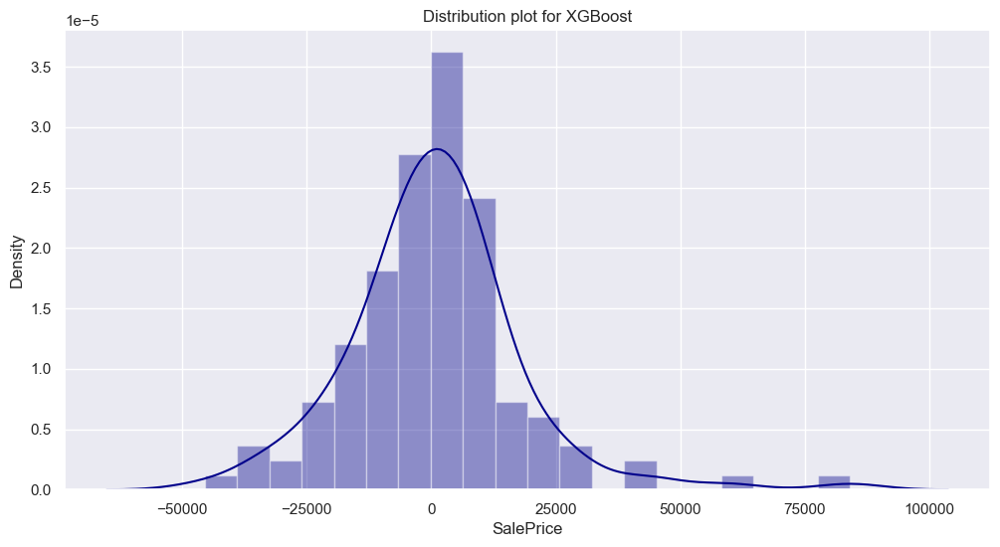

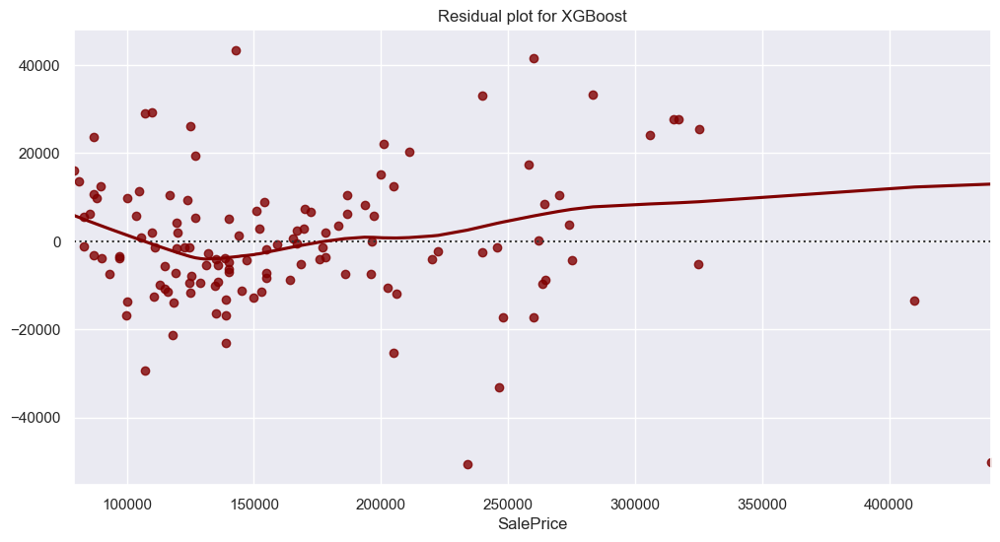

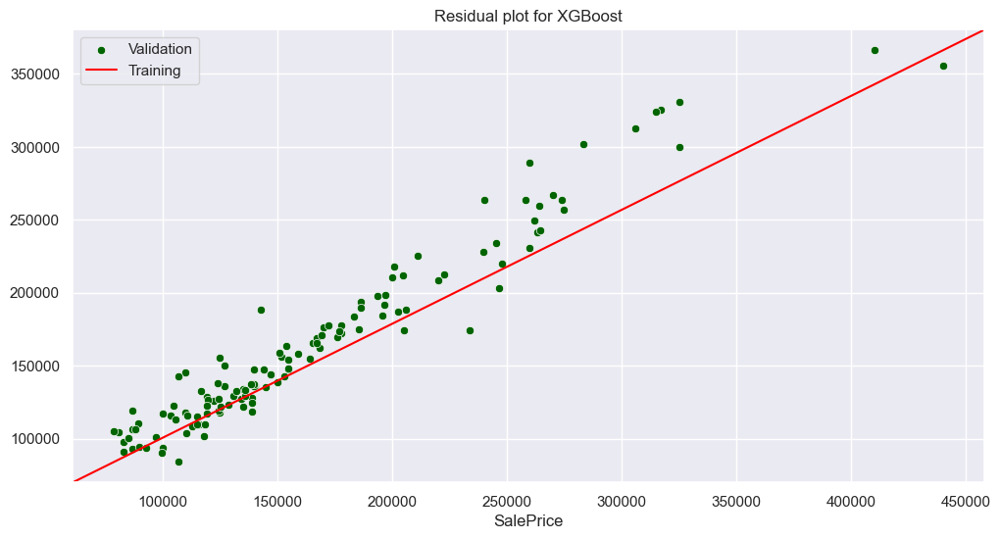

In [124]:
applied_model = 'XGBoost'

residual_dist(residuals, applied_model) 
residual_scatter(y_val, y_prediction)

<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Model Comparison  </b></div> 

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Training Scores (scores may differ upon multiple data allocation) </span>

In [144]:
print("◘ Training Scores:")
print(f"1. Linear Regression | R2-Score: {round(lr_train_score, 2)}")
print(f"2. Random Forest | R2-Score: {round(rf_train_score, 2)}")
print(f"3. GBR | R2-Score: {round(gbr_train_score, 2)}")
print(f"4. Poisson Regression | R2-Score: {round(poi_train_score, 2)}")
print(f"5. XGBoost | R2-Score: {round(xgb_train_score, 2)}")

◘ Training Scores:
1. Linear Regression | R2-Score: 0.88
2. Random Forest | R2-Score: 0.97
3. GBR | R2-Score: 0.97
4. Poisson Regression | R2-Score: 0.93
5. XGBoost | R2-Score: 0.97


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Validation Scores (scores may differ upon multiple data allocation) </span>

In [138]:
print("◘ Validation Scores:")
print(f"1. Linear Regression | R2-Score: {round(lr_val_score, 2)} | RMSE: {round(lr_rmse, 2)} | MAE: {round(lr_mae, 2)}")
print(f"2. Random Forest | R2-Score: {round(rf_val_score, 2)} | RMSE: {round(rf_rmse, 2)} | MAE: {round(rf_mae, 2)}")
print(f"3. GBR | R2-Score: {round(gbr_val_score, 2)} | RMSE: {round(gbr_rmse, 2)} | MAE: {round(gbr_mae, 2)}")
print(f"4. Poisson Regression | R2-Score: {round(poi_val_score, 2)} | RMSE: {round(poi_rmse, 2)} | MAE: {round(poi_mae, 2)}")
print(f"5. XGBoost | R2-Score: {round(xgb_val_score, 2)} | RMSE: {round(xgb_rmse, 2)} | MAE: {round(xgb_mae, 2)}")

◘ Validation Scores:
1. Linear Regression | R2-Score: 0.88 | RMSE: 0.21 | MAE: 0.14
2. Random Forest | R2-Score: 0.92 | RMSE: 0.17 | MAE: 0.12
3. GBR | R2-Score: 0.93 | RMSE: 0.16 | MAE: 0.11
4. Poisson Regression | R2-Score: 0.85 | RMSE: 0.22 | MAE: 0.14
5. XGBoost | R2-Score: 0.94 | RMSE: 0.15 | MAE: 0.11


 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Observations </span>

 <span style="font-family:Cambria; color:#0261ab; font-size: 18px; text-shadow: 0.5px 0.5px black"> 
    1. Linear Regression -   Mediocre training and validation score. Perfect fit.   </span> <br>
     <span style="font-family:Cambria; color:#0261ab; font-size: 18px; text-shadow: 0.5px 0.5px black"> 
    2. Random Forest -   Solid training and decent validation score. Slight overfitting. </span> <br>
     <span style="font-family:Cambria; color:#0261ab; font-size: 18px; text-shadow: 0.5px 0.5px black"> 
    3. GBR -   Solid training and good validation score. Slight overfitting. </span> <br>
     <span style="font-family:Cambria; color:#0261ab; font-size: 18px; text-shadow: 0.5px 0.5px black"> 
    4. Poisson Regression -   Decent training and poor validation score. Highly overfitting. </span> <br>
     <span style="font-family:Cambria; color:#0261ab; font-size: 18px; text-shadow: 0.5px 0.5px black"> 
    5. XGBoost -   Solid training and good validation score. Nearly perfect fit. </span> <br>

<a id="A"></a>  
# <div style="text-align:left; border-radius:10px 50px; padding:15px; color:white; margin:0; font-size:95%; font-family:Pacifico; background-color:indigo; overflow:hidden"><b> Submissions  </b></div> 

In [139]:
X_test = df_test


In [140]:
y_prediction = xgb_pipeline.predict(X_test)


In [142]:
def submit_method(test_id, y_prediction):
    sub = pd.DataFrame()
    sub['Id'] = test_id
    sub['SalePrice'] = y_prediction
    sub.to_csv('submission/submission.csv', index=False)
    
submit_method(test_id, y_prediction)

 <span style="font-family:Cambria; color:#0261ab; font-size: 20px; text-shadow: 0.5px 0.5px black"> • Conclusion </span>

 <span style="font-family:Cambria; color:#0261ab; font-size: 18px; text-shadow: 0.5px 0.5px black"> 
    The validation score achieved is 0.15 RMSE whereas the test score achieved after submission is also 0.15. Confirming that the XGB Model is highly reliable and consistent across all boards in generalizing the house prices based on the dataset.
</span>